# Install dependacies and import libraries

Firstly we will need to install a few things, namely pytorch! Each time you run the notebook you'll need to reinstall.

In [1]:
# Url management.
import io
from six.moves.urllib.request import urlopen

# For teacher forcing.
import random

# Audio libraries.
import IPython
import librosa
import librosa.display

# A very useful numerical package.
import numpy as np

# NumPy on steriods.
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.autograd import Variable

# Stats for outlier detection.
from scipy import stats
from sklearn import svm
from sklearn import decomposition
from sklearn.neighbors import LocalOutlierFactor

# To make nice plots.
import matplotlib.font_manager
import matplotlib.pyplot as plt

import sys

sys.path.append('../search/')
sys.path.append('../')

from dataset import AudioDataset
from utils import griffin_lim

In [2]:
def to_var(x):
  if torch.cuda.is_available():
      x = x.cuda()
  return Variable(x)

# Build models

Now we build the generator and discriminator

In [3]:
class EncoderRNN(nn.Module):
  
  """The encoder takes a batch of FFT frame sequences and returns encodings.
  
  There are no embeddings as the inputs are already real values, and the
  objective is to take FFT frames sequences (batch_size, sequence_length,
  fft_size) and return the encodings (batch_size, sequence_length, hidden_size).
  """
  
  def __init__(self, 
               input_size, 
               batch_size,
               hidden_size, 
               number_layers=1, 
               dropout=0.1,
               bi_directional=True,
               rnn=nn.GRU):
    
    """The __init__ function.

    Sets up the encoder with the specified amount of layers and hidden size.
    Uses a different mask for each timestep, which has been shown to perform
    worse than if the mask was the same, for diffent layers at different
    timesteps as in https://arxiv.org/abs/1512.05287. So be wary of this! To
    entirely cancel out the dropout, just set dropout to zero.
    
    Arguments:
      input_size: Size of the input FFT frames.
      hidden_size: Size of the hidden learnable weights for the RNN.
      number_layers: How many layers the encoding RNN should have.
      dropout: Zero for no dropout, one for complete dropout.
      bi_directional: Whether or not the RNN should run in two directions.
      rnn_type: Pass a RNN module here such as nn.GRU or nn.LSTM.
    """
    
    super(EncoderRNN, self).__init__()
    
    self.input_size = input_size
    self.batch_size = batch_size
    self.hidden_size = hidden_size
    self.number_layers = number_layers
    self.dropout = dropout
    self.bi_directional = bi_directional
    self.rnn = rnn(input_size=input_size,
                   hidden_size=hidden_size,
                   num_layers=number_layers, 
                   bidirectional=bi_directional,
                   batch_first=True)
    
    
  def forward(self, x, hidden):
    """The forward propoagation function. 
    
    The 
    """
    
    x, hidden = self.rnn(x, hidden)
    
    # linearly sum bi-directional outputs if appropriate.
    if self.bi_directional:
      forward = x[:, :, :self.hidden_size]
      backward = x[:, : ,self.hidden_size:]
      x = forward + backward
    
    return x, hidden
  
  
  def init_hidden(self):
    """"""
    amount = 2 if self.bi_directional else 1
    tensor = torch.FloatTensor(self.number_layers * amount, 
                               self.batch_size, 
                               self.hidden_size)
    return to_var(tensor.fill_(0))

  
  
class Attention(nn.Module):
  
  """An attention module that can switch between different scoring methods.
  
  The general form of the attention calculation uses the target decoder hidden
  state and the encoder state.
  
  Find the scoring methods here: https://arxiv.org/abs/1508.04025. The options
  are; 'dot', a dot product between the decoder and encoder state; 'general', 
  the dot product between the decoder state and a linear transform of the
  encoder state; 'concat', a dot product between a new parameter 'v' and a 
  linear transform of the states concatenated together. Finally the result is
  normalised.
  """
  
  def __init__(self, method, batch_size, hidden_size, bias=True):
    super(Attention, self).__init__()
    
    self.method = method
    self.batch_size = batch_size
    self.hidden_size = hidden_size
    
    
    
    if self.method == 'general':
      self.attention = nn.Linear(hidden_size, hidden_size, bias=bias)
      
    elif self.method == 'concat':
      self.attention = nn.Linear(hidden_size * 2, hidden_size, bias=bias)
      self.v = nn.Parameter(torch.FloatTensor(batch_size, 1, hidden_size))
      
    
  def forward(self, hidden, encoder_outputs):
    max_length = encoder_outputs.size(1)
    
    if self.method == 'general':
      attention_energies = self.attention(encoder_outputs).transpose(2, 1)
      attention_energies = hidden.bmm(attention_energies)
    
    elif self.method == 'concat':
      # Broadcast hidden to encoder_outputs size.
      hidden *= to_var(encoder_outputs.data.new(encoder_outputs.size()).fill_(1))
      concat = torch.cat((hidden, encoder_outputs), -1)
      attention_energies = self.attention(concat)
      
      # Swap the second and first dimensions. 
      attention_energies = attention_energies.transpose(2, 1)
      attention_energies = self.v.bmm(attention_energies)
      
    else:
      # Method is 'dot'.
      encoder_outputs = encoder_outputs.transpose(2, 1)
      attention_energies = hidden.bmm(encoder_outputs)
      
    return F.softmax(attention_energies)
    
  
  
  def score(self, hidden, encoder_output):
    
    if self.method == 'dot':
      energy = hidden.dot(encoder_output)
      
    elif self.method == 'general':
      energy = self.attention(encoder_output)
      energy = hidden.dot(encoder_output)
      
    elif self.method == 'concat':
      concat = torch.cat((hidden, encoder_output), 1)
      energy = self.attention(concat)
      energy = self.v.dot(energy)
      
    return energy
      
        

class AttentionDecoderRNN(nn.Module):
  
  """Luong Attention Decoder RNN module.
  
  This decoder plugs in the Attention module ater the RNN to calculate the """
  
  def __init__(self, 
               attention_method,
               batch_size,
               hidden_size, 
               output_size, 
               number_layers=1, 
               dropout=0.1):
    
    super(AttentionDecoderRNN, self).__init__()
    
    self.attention_method = attention_method
    self.batch_size = batch_size
    self.hidden_size = hidden_size
    self.output_size = output_size
    self.number_layers = number_layers
    self.dropout = dropout
    
    self.rnn = nn.GRU(hidden_size, 
                      hidden_size, 
                      number_layers, 
                      dropout=dropout, 
                      batch_first=True)
    
    self.concat = nn.Linear(hidden_size * 2, hidden_size)
    self.output = nn.Linear(hidden_size, output_size)
    
    self.attention = Attention(attention_method, batch_size, hidden_size)
    
    
  def forward(self, input_sequence, last_hidden, encoder_outputs):
    
    # Get current hidden state from input sequence and last hidden state.
    rnn_output, hidden = self.rnn(input_sequence, last_hidden)
    
    # Calculate attention from the current RNN state and all encoder outputs.
    attention_weights = self.attention(rnn_output, encoder_outputs)
    
    # bmm = batch matrix matrix product. Apply attention to encoder outputs to
    # get the weighted average.
    context = attention_weights.bmm(encoder_outputs)
    
    # Attentional vector using the RNN hidden state and context vector
    # concatenated together (Luong eq. 5).
    concat_input = torch.cat((rnn_output, context), -1)
    concat_output = F.tanh(self.concat(concat_input))
    
    # Finally predict next frame (Luong eq. 6, without softmax).
    output = self.output(concat_output)
    
    # Return final output, hidden state, and attention weights. We can use the
    # attention weights for visualisation.
    return output, hidden, attention_weights

# Test the encoder and decoder

In [4]:
if False:
  test_hidden_size     = 32
  test_input_size      = 32
  test_number_layers   = 3
  test_batch_size      = 16
  test_sequence_length = 7

  encoder_test = EncoderRNN(input_size=test_input_size,
                            batch_size=test_batch_size,
                            hidden_size=test_hidden_size,
                            number_layers=test_number_layers)
  
  decoder_test = AttentionDecoderRNN(attention_method='general',
                                     batch_size=test_batch_size,
                                     hidden_size=test_hidden_size,
                                     output_size=test_input_size,
                                     number_layers=test_number_layers)

  if torch.cuda.is_available():
    encoder_test.cuda()
    decoder_test.cuda()

  test_input_batches = to_var(torch.zeros(test_batch_size,
                                          test_sequence_length, 
                                          test_input_size))
  test_target_batches = to_var(torch.zeros(test_batch_size,
                                           test_sequence_length, 
                                           test_input_size))

  test_encoder_hidden = encoder_test.init_hidden()
  test_encoder_outputs, test_encoder_hidden = encoder_test(test_input_batches, 
                                                           test_encoder_hidden)

  # (batch_size, sequence_length, hidden_size)
  print('encoder outputs size      {}'.format(tuple(test_encoder_outputs.size())))

  # (number_layers * num_directions, sequence_length, hidden_size)
  print('encoder hidden state size {}'.format(tuple(test_encoder_hidden.size())))

  test_decoder_input = to_var(torch.zeros(test_batch_size, 
                                          test_sequence_length, 
                                          test_hidden_size))
  test_decoder_hidden = test_encoder_hidden[:decoder_test.number_layers]
 

  test_decoder_output, test_decoder_hidden, test_decoder_attention = \
    decoder_test(test_decoder_input, test_decoder_hidden, test_encoder_outputs)

  test_criterion = nn.MSELoss()
  test_loss = test_criterion(test_decoder_output, test_target_batches)
  print(test_loss.data[0])

# Utilites

You can look for music urls [here](https://www.jewelbeat.com/free/free-background-music.htm)

In [5]:
def outlier_detection(data, 
                      contamination_fraction=0.25, 
                      amount_neighbours=35, 
                      figure_width=8,
                      append_covariance=False,
                      inline=False):
  
  # Get rank-2 data points.
  number_data_points = len(data)
  data = np.array(data).reshape((number_data_points, -1))

  # perform dimensionality reduction if necessary for visualisation.
  if data.shape[1] > 2:
    pca = decomposition.PCA(n_components=2)
    pca.fit(data)
    data = pca.transform(data)
    
  # Setup.
  xx, yy = np.meshgrid(np.linspace(data.min(), data.max(), 100), 
                       np.linspace(data.min(), data.max(), 100))
    
  # Instanciate outlier detection methods and find anomolies & descision bounds.
  lof = LocalOutlierFactor(n_neighbors=amount_neighbours,
                           contamination=contamination_fraction)
  lof_predictions = lof.fit_predict(data)
  lof_scores_pred = lof.negative_outlier_factor_
  lof_threshold = stats.scoreatpercentile(lof_scores_pred, 
                                          100 * contamination_fraction)
  lof_z = lof._decision_function(np.c_[xx.ravel(), yy.ravel()])
  
  # Plot everything.
  plot_data = [
      ('Local Outlier Factor', lof_z, lof_threshold, lof_predictions)
  ]
  
  # Add robust covarince method. Need fix decision boundary!
  if append_covariance:
    env = EllipticEnvelope(contamination=contamination_fraction)
    env.fit(data)
    env_predictions = env.decision_function(data)
    env_scores_pred = env.predict(data)
    env_threshold = stats.scoreatpercentile(env_scores_pred,
                                            100 * contamination_fraction)
    env_z = env.decision_function(np.c_[xx.ravel(), yy.ravel()])
    cova_data = ('Robust Covariance', env_z, env_threshold, env_scores_pred)
    plot_data.append(cova_data)
    
  fig = plt.figure(figsize=(figure_width, figure_width * len(plot_data)))
  plot_number = 1
  for title, z, threshold, predictions in plot_data:
    z = z.reshape(xx.shape)
    sub_plot = fig.add_subplot(len(plot_data), 1, plot_number)
    sub_plot.contourf(xx, yy, z, levels=np.linspace(z.min(), threshold, 7), cmap=plt.cm.Blues_r)
    sub_plot.contour(xx, yy, z, levels=[threshold], linewidths=2, colors='red')
    sub_plot.contourf(xx, yy, z, levels=[threshold, z.max()], colors='orange')

    inliers = data[np.where(predictions == 1)]
    outliers = data[np.where(predictions == -1)]
    sub_plot.scatter(inliers[:,0], inliers[:,1], c='white', s=20, edgecolor='k')
    sub_plot.scatter(outliers[:,0], outliers[:,1], c='black', s=20, edgecolor='k')

    sub_plot.axis('tight')
    sub_plot.set_xlabel(title)
    sub_plot.set_xlim((data.min(), data.max()))
    sub_plot.set_ylim((data.min(), data.max()))
    
    plot_number += 1
  
  # Convert to NumPy array and return!
  fig.subplots_adjust(0.04, 0.1, 0.96, 0.94, 0.1, 0.26)
  fig.suptitle("Outlier detection")
  
  if not inline:
    plt.close()
  else:
    fig.savefig('outlier_detection.png', dpi=fig.dpi)
  
  return fig, np.where(lof_predictions == -1)[0]



def plot_audio(data):
  plt.figure()
  stft = librosa.amplitude_to_db(librosa.stft(data), ref=np.max)
  librosa.display.specshow(stft, y_axis='log')
  plt.show()
  

# Train and inference functions

In [6]:
def train(encoder, 
          decoder, 
          encoder_optimiser,
          decoder_optimiser, 
          input_batch, 
          target_batch,
          criterion,
          clip_threshold):
  
  # Zero the gradients of both optimisers.
  encoder_optimiser.zero_grad()
  decoder_optimiser.zero_grad()
  
  batch_size, sequence_length, fft_size = tuple(input_batch.size())
  
  # Run the input batch of fft sequences through the encoder.
  encoder_hidden = encoder.init_hidden()
  encoder_outputs, encoder_hidden = encoder(input_batch, encoder_hidden)
  
  # Prepare the input and output variables.
  decoder_input = input_batch
  decoder_hidden = encoder_hidden[:decoder.number_layers]
  
  decoder_output, decoder_hidden, decoder_attention = \
    decoder(decoder_input, decoder_hidden, encoder_outputs)
   
  # How close were we to the targets?
  loss = criterion(decoder_output, target_batch)
  loss.backward()
  
  # Clip the gradient norms.
  torch.nn.utils.clip_grad_norm(encoder.parameters(), clip_threshold)
  torch.nn.utils.clip_grad_norm(decoder.parameters(), clip_threshold)
  
  # Update parameters with optimisers.
  encoder_optimiser.step()
  decoder_optimiser.step()
  
  return loss.data[0]   

In [7]:
def run(encoder, 
        decoder, 
        start_sequences,
        amount_frames):
  
  encoder.train(False)
  decoder.train(False)
  
  # Get random sequence from dataset object. 
  batch_size, sequence_length, fft_size = start_sequences.size()
  model_input = start_sequences.view(batch_size, sequence_length, fft_size)
  
  frames = np.zeros((amount_frames, batch_size, sequence_length, fft_size))
  
  # Repeatedly sample the RNN and get the output.
  for i in range(amount_frames):

    encoder_hidden = encoder.init_hidden()
    encoder_outputs, encoder_hidden = encoder(model_input, encoder_hidden)
    
    decoder_input = model_input
    decoder_hidden = encoder_hidden[:decoder.number_layers]
    
    decoder_output, decoder_hidden, _ = \
      decoder(decoder_input, decoder_hidden, encoder_outputs)

    model_input = decoder_output    
    frames[i] = Variable(decoder_output.data).cpu().data.numpy()
    
  encoder.train(True)
  decoder.train(True)
    
  return frames.reshape((batch_size, -1, fft_size))
  

# Hyper parameters

In [8]:
!ls massive_chops/trimmed

atmos_trimmed.wav  harpsi_trimmed.wav	  piano_trimmed.wav
bass_trimmed.wav   mellotron_trimmed.wav  vocals_trimmed.wav
drums_trimmed.wav  organ_trimmed.wav


Settings Done.
Encoder Done.
Decoder Done.


/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


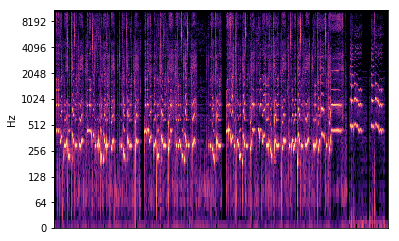

In [9]:
# Hyper parameters.
seed                   = 42
attention_method       = 'general'
fft_size               = 1024
number_layers          = 3
dropout                = 0.0
input_noise            = 0.2
sequence_length        = 150 # was 50, 150
clip_threshold         = 5.0
criterion              = nn.MSELoss()
learning_rate          = 0.00001
decoder_learning_ratio = 5.0
batch_size             = 8 # was 64
number_epochs          = 100
evaluate_every_epoch   = 5
feature_size = input_size = hidden_size = (fft_size // 2) + 1
hop_length = fft_size // 4

path = "./massive_chops/trimmed/vocals_trimmed.wav"

print("Settings Done.")

# Construct RNNs and optimisers.
encoder = EncoderRNN(input_size=feature_size,
                     batch_size=batch_size,
                     hidden_size=feature_size,
                     number_layers=number_layers,
                     dropout=dropout)

print("Encoder Done.")

decoder = AttentionDecoderRNN(attention_method,
                              batch_size=batch_size,
                              hidden_size=hidden_size,
                              output_size=feature_size,
                              number_layers=number_layers,
                              dropout=dropout)

print("Decoder Done.")

# Enable GPU tensors provided GPUs actually exist!
if torch.cuda.is_available():
  encoder.cuda()
  decoder.cuda()
  criterion.cuda()
  torch.cuda.manual_seed(seed)
else:
  torch.manual_seed(seed)
  
encoder_optimiser = torch.optim.Adam(encoder.parameters(), lr=learning_rate)
decoder_optimiser = torch.optim.Adam(decoder.parameters(), 
                                     lr=learning_rate * decoder_learning_ratio)

dataset = AudioDataset(fft_size=fft_size,
                       hop_length=hop_length,
                       batch_size=batch_size,
                       sequence_length=sequence_length,
                       path=path,
                       input_noise=input_noise)

# Plot and listen to the audio.
plot_audio(dataset.data) 
IPython.display.Audio(dataset.data, rate=dataset.sample_rate)

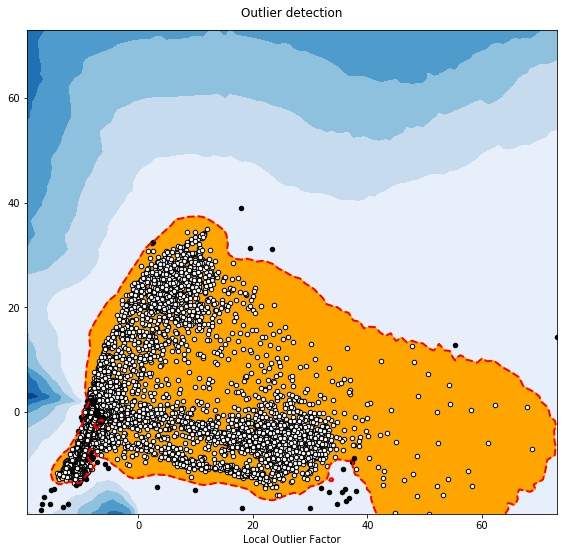

In [10]:
_ = outlier_detection(dataset.magnitudes, contamination_fraction=0.01, inline=True)

/home/eavi/leon/leon/lib/python3.5/site-packages/ipykernel_launcher.py:132: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


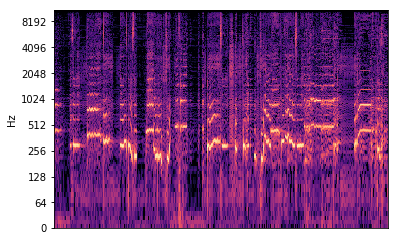

epoch 0/100, loss 0.018180428072810173
epoch 0/100, loss 0.017692863941192627
epoch 0/100, loss 0.023399867117404938
epoch 0/100, loss 0.021775459870696068
epoch 0/100, loss 0.020494705066084862
epoch 0/100, loss 0.015963654965162277
epoch 0/100, loss 0.021980738267302513
epoch 0/100, loss 0.018801217898726463
epoch 0/100, loss 0.023573020473122597
epoch 0/100, loss 0.013997018337249756
epoch 0/100, loss 0.022931527346372604
epoch 0/100, loss 0.014577038586139679
epoch 0/100, loss 0.01861732080578804
epoch 0/100, loss 0.021071365103125572
epoch 0/100, loss 0.03186463192105293
epoch 0/100, loss 0.029729481786489487
epoch 0/100, loss 0.017507094889879227
epoch 0/100, loss 0.02385512925684452
epoch 0/100, loss 0.022658519446849823
epoch 0/100, loss 0.014553437009453773
epoch 0/100, loss 0.02055748552083969
epoch 0/100, loss 0.03339756652712822
epoch 0/100, loss 0.0188220776617527
epoch 0/100, loss 0.02033659629523754
epoch 0/100, loss 0.019234411418437958
epoch 0/100, loss 0.0246133245527

epoch 0/100, loss 0.01827303320169449
epoch 0/100, loss 0.02624092623591423
epoch 0/100, loss 0.020968936383724213
epoch 0/100, loss 0.013088913634419441
epoch 0/100, loss 0.02054404281079769
epoch 0/100, loss 0.03254329413175583
epoch 0/100, loss 0.020261626690626144
epoch 0/100, loss 0.020267484709620476
epoch 0/100, loss 0.023584041744470596
epoch 0/100, loss 0.014823032543063164
epoch 0/100, loss 0.014821488410234451
epoch 0/100, loss 0.015330635011196136
epoch 0/100, loss 0.016825681552290916
epoch 0/100, loss 0.021608442068099976
epoch 0/100, loss 0.03207217901945114
epoch 0/100, loss 0.029479896649718285
epoch 0/100, loss 0.01958737149834633
epoch 0/100, loss 0.028440076857805252
epoch 0/100, loss 0.016942361369729042
epoch 0/100, loss 0.02013206109404564
epoch 0/100, loss 0.034958064556121826
epoch 0/100, loss 0.020427364856004715
epoch 0/100, loss 0.01663127727806568
epoch 0/100, loss 0.022364500910043716
epoch 0/100, loss 0.02115459181368351
epoch 0/100, loss 0.01919393055140

epoch 0/100, loss 0.01867377571761608
epoch 0/100, loss 0.017626019194722176
epoch 0/100, loss 0.023410020396113396
epoch 0/100, loss 0.020751232281327248
epoch 0/100, loss 0.027322493493556976
epoch 0/100, loss 0.012145992368459702
epoch 0/100, loss 0.031011100858449936
epoch 0/100, loss 0.01366383396089077
epoch 0/100, loss 0.022476941347122192
epoch 0/100, loss 0.0175725519657135
epoch 0/100, loss 0.022738931700587273
epoch 0/100, loss 0.026508839800953865
epoch 0/100, loss 0.02160727232694626
epoch 0/100, loss 0.02654431015253067
epoch 0/100, loss 0.016410740092396736
epoch 0/100, loss 0.01915544643998146
epoch 0/100, loss 0.03248436376452446
epoch 0/100, loss 0.023373425006866455
epoch 0/100, loss 0.02418721839785576
epoch 0/100, loss 0.025976698845624924
epoch 0/100, loss 0.013587580993771553
epoch 0/100, loss 0.02375515177845955
epoch 0/100, loss 0.025546571239829063
epoch 0/100, loss 0.014117443934082985
epoch 0/100, loss 0.02135908044874668
epoch 0/100, loss 0.0197745654731988

epoch 0/100, loss 0.018410934135317802
epoch 0/100, loss 0.02891821786761284
epoch 0/100, loss 0.012318022549152374
epoch 0/100, loss 0.016522258520126343
epoch 0/100, loss 0.021457413211464882
epoch 0/100, loss 0.02022581733763218
epoch 0/100, loss 0.02664986625313759
epoch 0/100, loss 0.03626861795783043
epoch 0/100, loss 0.02444612979888916
epoch 0/100, loss 0.023324886336922646
epoch 0/100, loss 0.02263970673084259
epoch 0/100, loss 0.02226722240447998
epoch 0/100, loss 0.01968647912144661
epoch 0/100, loss 0.014978284016251564
epoch 0/100, loss 0.024555880576372147
epoch 0/100, loss 0.026531090959906578
epoch 0/100, loss 0.020076120272278786
epoch 0/100, loss 0.020346643403172493
epoch 0/100, loss 0.018429556861519814
epoch 0/100, loss 0.026672054082155228
epoch 0/100, loss 0.01976686716079712
epoch 0/100, loss 0.024264544248580933
epoch 0/100, loss 0.01743522472679615
epoch 0/100, loss 0.022242162376642227
epoch 0/100, loss 0.018984954804182053
epoch 0/100, loss 0.023639352992177

epoch 0/100, loss 0.0162831898778677
epoch 0/100, loss 0.02671239525079727
epoch 0/100, loss 0.026006905362010002
epoch 0/100, loss 0.019538013264536858
epoch 0/100, loss 0.01681215688586235
epoch 0/100, loss 0.02085120417177677
epoch 0/100, loss 0.014149961061775684
epoch 0/100, loss 0.016673607751727104
epoch 0/100, loss 0.02506296895444393
epoch 0/100, loss 0.02981295809149742
epoch 0/100, loss 0.02009722776710987
epoch 0/100, loss 0.019364025443792343
epoch 0/100, loss 0.0351153165102005
epoch 0/100, loss 0.02248295210301876
epoch 0/100, loss 0.013434073887765408
epoch 0/100, loss 0.022939415648579597
epoch 0/100, loss 0.014284671284258366
epoch 0/100, loss 0.01802925579249859
epoch 0/100, loss 0.018090100958943367
epoch 0/100, loss 0.018576109781861305
epoch 0/100, loss 0.01279329601675272
epoch 0/100, loss 0.017463786527514458
epoch 0/100, loss 0.0219174325466156
epoch 0/100, loss 0.01628507487475872
epoch 0/100, loss 0.031736984848976135
epoch 0/100, loss 0.013257982209324837
ep

epoch 0/100, loss 0.012776782736182213
epoch 0/100, loss 0.021186649799346924
epoch 0/100, loss 0.03924161568284035
epoch 0/100, loss 0.02666570246219635
epoch 0/100, loss 0.014930539764463902
epoch 0/100, loss 0.01831609383225441
epoch 0/100, loss 0.01540319062769413
epoch 0/100, loss 0.0196688212454319
epoch 0/100, loss 0.020877381786704063
epoch 0/100, loss 0.02539508417248726
epoch 0/100, loss 0.022106535732746124
epoch 0/100, loss 0.014621010981500149
epoch 0/100, loss 0.01583215966820717
epoch 0/100, loss 0.0211692713201046
epoch 0/100, loss 0.03238718584179878
epoch 0/100, loss 0.018203726038336754
epoch 0/100, loss 0.03444201871752739
epoch 0/100, loss 0.022749096155166626
epoch 0/100, loss 0.015659306198358536
epoch 0/100, loss 0.015286185778677464
epoch 0/100, loss 0.01896410621702671
epoch 0/100, loss 0.018841130658984184
epoch 0/100, loss 0.011949305422604084
epoch 0/100, loss 0.018812254071235657
epoch 0/100, loss 0.01656746305525303
epoch 0/100, loss 0.012975706718862057


epoch 0/100, loss 0.015084344893693924
epoch 0/100, loss 0.012105351313948631
epoch 0/100, loss 0.021998224779963493
epoch 0/100, loss 0.018634529784321785
epoch 0/100, loss 0.018299708142876625
epoch 0/100, loss 0.01565128192305565
epoch 0/100, loss 0.014376669190824032
epoch 0/100, loss 0.017128359526395798
epoch 0/100, loss 0.019003404304385185
epoch 0/100, loss 0.01119005586951971
epoch 0/100, loss 0.023089533671736717
epoch 0/100, loss 0.022874727845191956
epoch 0/100, loss 0.022206587716937065
epoch 0/100, loss 0.021074743941426277
epoch 0/100, loss 0.016565700992941856
epoch 0/100, loss 0.033972229808568954
epoch 0/100, loss 0.018956586718559265
epoch 0/100, loss 0.01278829388320446
epoch 0/100, loss 0.022740310057997704
epoch 0/100, loss 0.024435946717858315
epoch 0/100, loss 0.01840006187558174
epoch 0/100, loss 0.019933421164751053
epoch 0/100, loss 0.024102989584207535
epoch 0/100, loss 0.016510631889104843
epoch 0/100, loss 0.01866682432591915
epoch 0/100, loss 0.0132107660

epoch 1/100, loss 0.02786143869161606
epoch 1/100, loss 0.019094904884696007
epoch 1/100, loss 0.017818626016378403
epoch 1/100, loss 0.02489236742258072
epoch 1/100, loss 0.015958046540617943
epoch 1/100, loss 0.024245506152510643
epoch 1/100, loss 0.013224928639829159
epoch 1/100, loss 0.011707277037203312
epoch 1/100, loss 0.022865938022732735
epoch 1/100, loss 0.025952840223908424
epoch 1/100, loss 0.020609049126505852
epoch 1/100, loss 0.022843843325972557
epoch 1/100, loss 0.012830370105803013
epoch 1/100, loss 0.027506990358233452
epoch 1/100, loss 0.016855983063578606
epoch 1/100, loss 0.014321918599307537
epoch 1/100, loss 0.029310783371329308
epoch 1/100, loss 0.0277010016143322
epoch 1/100, loss 0.02339581958949566
epoch 1/100, loss 0.017745019868016243
epoch 1/100, loss 0.015735646709799767
epoch 1/100, loss 0.027126148343086243
epoch 1/100, loss 0.023890595883131027
epoch 1/100, loss 0.02347313053905964
epoch 1/100, loss 0.014562531374394894
epoch 1/100, loss 0.03432658314

epoch 1/100, loss 0.016132503747940063
epoch 1/100, loss 0.017067408189177513
epoch 1/100, loss 0.0195276141166687
epoch 1/100, loss 0.013457238674163818
epoch 1/100, loss 0.017495950683951378
epoch 1/100, loss 0.017703330144286156
epoch 1/100, loss 0.0157853364944458
epoch 1/100, loss 0.027081118896603584
epoch 1/100, loss 0.031165722757577896
epoch 1/100, loss 0.02653643861413002
epoch 1/100, loss 0.01650824397802353
epoch 1/100, loss 0.011102160438895226
epoch 1/100, loss 0.02377827651798725
epoch 1/100, loss 0.016059648245573044
epoch 1/100, loss 0.016608336940407753
epoch 1/100, loss 0.019612593576312065
epoch 1/100, loss 0.02252558246254921
epoch 1/100, loss 0.02134811133146286
epoch 1/100, loss 0.025270292535424232
epoch 1/100, loss 0.032875124365091324
epoch 1/100, loss 0.020234137773513794
epoch 1/100, loss 0.024933652952313423
epoch 1/100, loss 0.021136118099093437
epoch 1/100, loss 0.019754508510231972
epoch 1/100, loss 0.016965532675385475
epoch 1/100, loss 0.01988488622009

epoch 1/100, loss 0.03267427906394005
epoch 1/100, loss 0.019538898020982742
epoch 1/100, loss 0.0233246311545372
epoch 1/100, loss 0.017960162833333015
epoch 1/100, loss 0.017374277114868164
epoch 1/100, loss 0.018360750749707222
epoch 1/100, loss 0.012822979129850864
epoch 1/100, loss 0.022631321102380753
epoch 1/100, loss 0.01722155325114727
epoch 1/100, loss 0.029167789965867996
epoch 1/100, loss 0.020745795220136642
epoch 1/100, loss 0.018244873732328415
epoch 1/100, loss 0.018108662217855453
epoch 1/100, loss 0.02472054958343506
epoch 1/100, loss 0.017533987760543823
epoch 1/100, loss 0.016173230484128
epoch 1/100, loss 0.01949678175151348
epoch 1/100, loss 0.02560318261384964
epoch 1/100, loss 0.012980201281607151
epoch 1/100, loss 0.022310039028525352
epoch 1/100, loss 0.026337655261158943
epoch 1/100, loss 0.018183177337050438
epoch 1/100, loss 0.01641007885336876
epoch 1/100, loss 0.018060801550745964
epoch 1/100, loss 0.02285107970237732
epoch 1/100, loss 0.01406600698828697

epoch 1/100, loss 0.024235134944319725
epoch 1/100, loss 0.01175463292747736
epoch 1/100, loss 0.017351698130369186
epoch 1/100, loss 0.012495460920035839
epoch 1/100, loss 0.015663685277104378
epoch 1/100, loss 0.025980114936828613
epoch 1/100, loss 0.015534000471234322
epoch 1/100, loss 0.007994658313691616
epoch 1/100, loss 0.025636065751314163
epoch 1/100, loss 0.014606318436563015
epoch 1/100, loss 0.013866465538740158
epoch 1/100, loss 0.014583763666450977
epoch 1/100, loss 0.017649423331022263
epoch 1/100, loss 0.024123022332787514
epoch 1/100, loss 0.020656198263168335
epoch 1/100, loss 0.020885350182652473
epoch 1/100, loss 0.024462731555104256
epoch 1/100, loss 0.024915311485528946
epoch 1/100, loss 0.031175903975963593
epoch 1/100, loss 0.0222417451441288
epoch 1/100, loss 0.025694629177451134
epoch 1/100, loss 0.022797074168920517
epoch 1/100, loss 0.01173703745007515
epoch 1/100, loss 0.01636704057455063
epoch 1/100, loss 0.02086492069065571
epoch 1/100, loss 0.01603252999

epoch 1/100, loss 0.015522708185017109
epoch 1/100, loss 0.016503572463989258
epoch 1/100, loss 0.023492923006415367
epoch 1/100, loss 0.013520955108106136
epoch 1/100, loss 0.017512615770101547
epoch 1/100, loss 0.014397438615560532
epoch 1/100, loss 0.028131945058703423
epoch 1/100, loss 0.01685878075659275
epoch 1/100, loss 0.0177138764411211
epoch 1/100, loss 0.0182585958391428
epoch 1/100, loss 0.019579557701945305
epoch 1/100, loss 0.021276602521538734
epoch 1/100, loss 0.015545986592769623
epoch 1/100, loss 0.02741897478699684
epoch 1/100, loss 0.01528757531195879
epoch 1/100, loss 0.018010664731264114
epoch 1/100, loss 0.02692611888051033
epoch 1/100, loss 0.017843663692474365
epoch 1/100, loss 0.01466256845742464
epoch 1/100, loss 0.02170749567449093
epoch 1/100, loss 0.014979069121181965
epoch 1/100, loss 0.017464730888605118
epoch 1/100, loss 0.014551777392625809
epoch 1/100, loss 0.018193455412983894
epoch 1/100, loss 0.029054876416921616
epoch 1/100, loss 0.012782502919435

epoch 1/100, loss 0.018500693142414093
epoch 1/100, loss 0.019025815650820732
epoch 1/100, loss 0.015965042635798454
epoch 1/100, loss 0.020407380536198616
epoch 1/100, loss 0.01915273629128933
epoch 1/100, loss 0.01624857820570469
epoch 1/100, loss 0.024904504418373108
epoch 1/100, loss 0.021641574800014496
epoch 1/100, loss 0.015652647241950035
epoch 1/100, loss 0.019076116383075714
epoch 1/100, loss 0.02552000805735588
epoch 1/100, loss 0.01971094310283661
epoch 1/100, loss 0.012812149710953236
epoch 1/100, loss 0.023608770221471786
epoch 1/100, loss 0.017674000933766365
epoch 1/100, loss 0.014259514398872852
epoch 1/100, loss 0.021276790648698807
epoch 1/100, loss 0.013763189315795898
epoch 1/100, loss 0.021654805168509483
epoch 1/100, loss 0.01434122771024704
epoch 1/100, loss 0.017460225149989128
epoch 1/100, loss 0.01388130895793438
epoch 1/100, loss 0.01407692302018404
epoch 1/100, loss 0.02866227738559246
epoch 1/100, loss 0.023514660075306892
epoch 1/100, loss 0.0159786809235

epoch 1/100, loss 0.013566537760198116
epoch 1/100, loss 0.01565753109753132
epoch 1/100, loss 0.011265529319643974
epoch 1/100, loss 0.019631527364253998
epoch 1/100, loss 0.01791069656610489
epoch 1/100, loss 0.024130888283252716
epoch 1/100, loss 0.02019544504582882
epoch 1/100, loss 0.02386164665222168
epoch 1/100, loss 0.017539938911795616
epoch 2/100, loss 0.009907242842018604
epoch 2/100, loss 0.01988373138010502
epoch 2/100, loss 0.022719403728842735
epoch 2/100, loss 0.012449233792722225
epoch 2/100, loss 0.02245228923857212
epoch 2/100, loss 0.012048597447574139
epoch 2/100, loss 0.020137201994657516
epoch 2/100, loss 0.015536258928477764
epoch 2/100, loss 0.01725863479077816
epoch 2/100, loss 0.02147161029279232
epoch 2/100, loss 0.017861947417259216
epoch 2/100, loss 0.019082406535744667
epoch 2/100, loss 0.01442963071167469
epoch 2/100, loss 0.020473066717386246
epoch 2/100, loss 0.016095023602247238
epoch 2/100, loss 0.019385259598493576
epoch 2/100, loss 0.02093060500919

epoch 2/100, loss 0.01914365030825138
epoch 2/100, loss 0.011152096092700958
epoch 2/100, loss 0.019162913784384727
epoch 2/100, loss 0.016429532319307327
epoch 2/100, loss 0.018613584339618683
epoch 2/100, loss 0.023796547204256058
epoch 2/100, loss 0.016581149771809578
epoch 2/100, loss 0.015227328054606915
epoch 2/100, loss 0.024695085361599922
epoch 2/100, loss 0.02705545537173748
epoch 2/100, loss 0.01825719140470028
epoch 2/100, loss 0.010711077600717545
epoch 2/100, loss 0.030111974105238914
epoch 2/100, loss 0.027579596266150475
epoch 2/100, loss 0.022888002917170525
epoch 2/100, loss 0.02501016855239868
epoch 2/100, loss 0.020835645496845245
epoch 2/100, loss 0.020252302289009094
epoch 2/100, loss 0.01998201571404934
epoch 2/100, loss 0.015422855503857136
epoch 2/100, loss 0.020211366936564445
epoch 2/100, loss 0.019630594179034233
epoch 2/100, loss 0.03377564251422882
epoch 2/100, loss 0.02876126579940319
epoch 2/100, loss 0.013551708310842514
epoch 2/100, loss 0.015530369244

epoch 2/100, loss 0.020845482125878334
epoch 2/100, loss 0.033639200031757355
epoch 2/100, loss 0.024364186450839043
epoch 2/100, loss 0.018914753571152687
epoch 2/100, loss 0.015650169923901558
epoch 2/100, loss 0.0140149537473917
epoch 2/100, loss 0.0157063826918602
epoch 2/100, loss 0.021446140483021736
epoch 2/100, loss 0.01660729944705963
epoch 2/100, loss 0.014468209818005562
epoch 2/100, loss 0.012886595912277699
epoch 2/100, loss 0.019890394061803818
epoch 2/100, loss 0.018388716503977776
epoch 2/100, loss 0.025974620133638382
epoch 2/100, loss 0.02072286792099476
epoch 2/100, loss 0.026874415576457977
epoch 2/100, loss 0.014852631837129593
epoch 2/100, loss 0.011043321341276169
epoch 2/100, loss 0.020933784544467926
epoch 2/100, loss 0.029745766893029213
epoch 2/100, loss 0.020733628422021866
epoch 2/100, loss 0.011436045169830322
epoch 2/100, loss 0.02136358805000782
epoch 2/100, loss 0.020589854568243027
epoch 2/100, loss 0.014131441712379456
epoch 2/100, loss 0.013776149600

epoch 2/100, loss 0.016829239204525948
epoch 2/100, loss 0.010412021540105343
epoch 2/100, loss 0.015501107089221478
epoch 2/100, loss 0.019555389881134033
epoch 2/100, loss 0.031067682430148125
epoch 2/100, loss 0.016707636415958405
epoch 2/100, loss 0.020743826404213905
epoch 2/100, loss 0.009365679696202278
epoch 2/100, loss 0.032302357256412506
epoch 2/100, loss 0.02364126779139042
epoch 2/100, loss 0.02654765360057354
epoch 2/100, loss 0.016036419197916985
epoch 2/100, loss 0.015231338329613209
epoch 2/100, loss 0.01664052903652191
epoch 2/100, loss 0.013105319812893867
epoch 2/100, loss 0.017724590376019478
epoch 2/100, loss 0.012253103777766228
epoch 2/100, loss 0.013561445288360119
epoch 2/100, loss 0.0207676962018013
epoch 2/100, loss 0.021464873105287552
epoch 2/100, loss 0.01598505675792694
epoch 2/100, loss 0.02424541860818863
epoch 2/100, loss 0.014783531427383423
epoch 2/100, loss 0.03838453069329262
epoch 2/100, loss 0.016166703775525093
epoch 2/100, loss 0.0163544323295

epoch 2/100, loss 0.014940622262656689
epoch 2/100, loss 0.01279717218130827
epoch 2/100, loss 0.02134377881884575
epoch 2/100, loss 0.017976535484194756
epoch 2/100, loss 0.03084530308842659
epoch 2/100, loss 0.027124445885419846
epoch 2/100, loss 0.024276843294501305
epoch 2/100, loss 0.013217098079621792
epoch 2/100, loss 0.019914649426937103
epoch 2/100, loss 0.028447186574339867
epoch 2/100, loss 0.01631223037838936
epoch 2/100, loss 0.014960620552301407
epoch 2/100, loss 0.018007153645157814
epoch 2/100, loss 0.014397638849914074
epoch 2/100, loss 0.03075481578707695
epoch 2/100, loss 0.018280627205967903
epoch 2/100, loss 0.01306142844259739
epoch 2/100, loss 0.013836738653481007
epoch 2/100, loss 0.01820702664554119
epoch 2/100, loss 0.01158392895013094
epoch 2/100, loss 0.028220143169164658
epoch 2/100, loss 0.024128859862685204
epoch 2/100, loss 0.029618483036756516
epoch 2/100, loss 0.016825584694743156
epoch 2/100, loss 0.018107552081346512
epoch 2/100, loss 0.0210283398628

epoch 2/100, loss 0.019849523901939392
epoch 2/100, loss 0.013325327076017857
epoch 2/100, loss 0.01782272942364216
epoch 2/100, loss 0.021411921828985214
epoch 2/100, loss 0.019981371238827705
epoch 2/100, loss 0.02157144621014595
epoch 2/100, loss 0.018465258181095123
epoch 2/100, loss 0.022007286548614502
epoch 2/100, loss 0.02510054036974907
epoch 2/100, loss 0.01664389669895172
epoch 2/100, loss 0.019996892660856247
epoch 2/100, loss 0.016338743269443512
epoch 2/100, loss 0.02395840734243393
epoch 2/100, loss 0.016449786722660065
epoch 2/100, loss 0.01880539208650589
epoch 2/100, loss 0.016337314620614052
epoch 2/100, loss 0.010401741601526737
epoch 2/100, loss 0.012634254060685635
epoch 2/100, loss 0.024590756744146347
epoch 2/100, loss 0.014590618200600147
epoch 2/100, loss 0.014616035856306553
epoch 2/100, loss 0.021298591047525406
epoch 2/100, loss 0.020969314500689507
epoch 2/100, loss 0.016591472551226616
epoch 2/100, loss 0.01806533895432949
epoch 2/100, loss 0.015474527142

epoch 2/100, loss 0.027934696525335312
epoch 2/100, loss 0.01917184889316559
epoch 2/100, loss 0.021004313603043556
epoch 2/100, loss 0.025371484458446503
epoch 2/100, loss 0.041072968393564224
epoch 2/100, loss 0.014873073436319828
epoch 2/100, loss 0.026492731645703316
epoch 2/100, loss 0.01802096702158451
epoch 2/100, loss 0.020211422815918922
epoch 2/100, loss 0.026496192440390587
epoch 2/100, loss 0.030560575425624847
epoch 2/100, loss 0.019879180938005447
epoch 2/100, loss 0.02590758353471756
epoch 2/100, loss 0.022424638271331787
epoch 2/100, loss 0.017330143600702286
epoch 2/100, loss 0.03824484720826149
epoch 2/100, loss 0.021770615130662918
epoch 2/100, loss 0.019699564203619957
epoch 2/100, loss 0.02208406664431095
epoch 2/100, loss 0.02466336265206337
epoch 2/100, loss 0.011458990164101124
epoch 2/100, loss 0.017834708094596863
epoch 2/100, loss 0.0195687934756279
epoch 2/100, loss 0.023161590099334717
epoch 2/100, loss 0.01728641428053379
epoch 2/100, loss 0.01322265807539

epoch 3/100, loss 0.020213892683386803
epoch 3/100, loss 0.02281816489994526
epoch 3/100, loss 0.0202767476439476
epoch 3/100, loss 0.023123767226934433
epoch 3/100, loss 0.01716155745089054
epoch 3/100, loss 0.01682109944522381
epoch 3/100, loss 0.017920052632689476
epoch 3/100, loss 0.016409071162343025
epoch 3/100, loss 0.013627392239868641
epoch 3/100, loss 0.020643090829253197
epoch 3/100, loss 0.023595966398715973
epoch 3/100, loss 0.019985251128673553
epoch 3/100, loss 0.018855640664696693
epoch 3/100, loss 0.01903204619884491
epoch 3/100, loss 0.019932609051465988
epoch 3/100, loss 0.025180315598845482
epoch 3/100, loss 0.027413908392190933
epoch 3/100, loss 0.013356976211071014
epoch 3/100, loss 0.014821181073784828
epoch 3/100, loss 0.015687167644500732
epoch 3/100, loss 0.014212649315595627
epoch 3/100, loss 0.020392445847392082
epoch 3/100, loss 0.02706741914153099
epoch 3/100, loss 0.030013924464583397
epoch 3/100, loss 0.017860716208815575
epoch 3/100, loss 0.018902642652

epoch 3/100, loss 0.023313011974096298
epoch 3/100, loss 0.01845541037619114
epoch 3/100, loss 0.01911843568086624
epoch 3/100, loss 0.012910483404994011
epoch 3/100, loss 0.030979573726654053
epoch 3/100, loss 0.0162690207362175
epoch 3/100, loss 0.017419511452317238
epoch 3/100, loss 0.01989348791539669
epoch 3/100, loss 0.032244399189949036
epoch 3/100, loss 0.01773197576403618
epoch 3/100, loss 0.01054556667804718
epoch 3/100, loss 0.014773371629416943
epoch 3/100, loss 0.019804438576102257
epoch 3/100, loss 0.016484547406435013
epoch 3/100, loss 0.020941199734807014
epoch 3/100, loss 0.014599233865737915
epoch 3/100, loss 0.015048502944409847
epoch 3/100, loss 0.019961196929216385
epoch 3/100, loss 0.012214851565659046
epoch 3/100, loss 0.021699046716094017
epoch 3/100, loss 0.03362332656979561
epoch 3/100, loss 0.024724366143345833
epoch 3/100, loss 0.01922982558608055
epoch 3/100, loss 0.01396279875189066
epoch 3/100, loss 0.02107519842684269
epoch 3/100, loss 0.0123275872319936

epoch 3/100, loss 0.016514761373400688
epoch 3/100, loss 0.011391395702958107
epoch 3/100, loss 0.020019371062517166
epoch 3/100, loss 0.017725110054016113
epoch 3/100, loss 0.02009504660964012
epoch 3/100, loss 0.02745482325553894
epoch 3/100, loss 0.023710744455456734
epoch 3/100, loss 0.031809475272893906
epoch 3/100, loss 0.023882482200860977
epoch 3/100, loss 0.013573779724538326
epoch 3/100, loss 0.018871961161494255
epoch 3/100, loss 0.01279822550714016
epoch 3/100, loss 0.01395662035793066
epoch 3/100, loss 0.019722918048501015
epoch 3/100, loss 0.018371999263763428
epoch 3/100, loss 0.02082272619009018
epoch 3/100, loss 0.01648496277630329
epoch 3/100, loss 0.028696054592728615
epoch 3/100, loss 0.02341209165751934
epoch 3/100, loss 0.017468078061938286
epoch 3/100, loss 0.03568943217396736
epoch 3/100, loss 0.02284538745880127
epoch 3/100, loss 0.020199855789542198
epoch 3/100, loss 0.02655220963060856
epoch 3/100, loss 0.02118738554418087
epoch 3/100, loss 0.0160539485514163

epoch 3/100, loss 0.034408580511808395
epoch 3/100, loss 0.020275287330150604
epoch 3/100, loss 0.0212290957570076
epoch 3/100, loss 0.017672697082161903
epoch 3/100, loss 0.013359633274376392
epoch 3/100, loss 0.01423718687146902
epoch 3/100, loss 0.008297295309603214
epoch 3/100, loss 0.01967550814151764
epoch 3/100, loss 0.014048440381884575
epoch 3/100, loss 0.015428080223500729
epoch 3/100, loss 0.030784768983721733
epoch 3/100, loss 0.02496088668704033
epoch 3/100, loss 0.0167740099132061
epoch 3/100, loss 0.009593339636921883
epoch 3/100, loss 0.019208664074540138
epoch 3/100, loss 0.01992534101009369
epoch 3/100, loss 0.022798148915171623
epoch 3/100, loss 0.021045764908194542
epoch 3/100, loss 0.016348455101251602
epoch 3/100, loss 0.011062861420214176
epoch 3/100, loss 0.01079116202890873
epoch 3/100, loss 0.02033570408821106
epoch 3/100, loss 0.014855029061436653
epoch 3/100, loss 0.02281133085489273
epoch 3/100, loss 0.019329821690917015
epoch 3/100, loss 0.0158233121037483

epoch 3/100, loss 0.020131435245275497
epoch 3/100, loss 0.026306699961423874
epoch 3/100, loss 0.012453034520149231
epoch 3/100, loss 0.027251234278082848
epoch 3/100, loss 0.024951597675681114
epoch 3/100, loss 0.024317972362041473
epoch 3/100, loss 0.017220107838511467
epoch 3/100, loss 0.018589172512292862
epoch 3/100, loss 0.02235511876642704
epoch 3/100, loss 0.02038399688899517
epoch 3/100, loss 0.009355618618428707
epoch 3/100, loss 0.018129948526620865
epoch 3/100, loss 0.0170980803668499
epoch 3/100, loss 0.014252012595534325
epoch 3/100, loss 0.02575029619038105
epoch 3/100, loss 0.020621685311198235
epoch 3/100, loss 0.016361577436327934
epoch 3/100, loss 0.025359177961945534
epoch 3/100, loss 0.015973707661032677
epoch 3/100, loss 0.02181098237633705
epoch 3/100, loss 0.0189057607203722
epoch 3/100, loss 0.020857373252511024
epoch 3/100, loss 0.012489750981330872
epoch 3/100, loss 0.011822490952908993
epoch 3/100, loss 0.01776566356420517
epoch 3/100, loss 0.01202828902751

epoch 3/100, loss 0.020965129137039185
epoch 3/100, loss 0.016864199191331863
epoch 3/100, loss 0.015098060481250286
epoch 3/100, loss 0.022305544465780258
epoch 3/100, loss 0.023238783702254295
epoch 3/100, loss 0.009779583662748337
epoch 3/100, loss 0.02849625237286091
epoch 3/100, loss 0.02459326945245266
epoch 3/100, loss 0.018715906888246536
epoch 3/100, loss 0.01177491806447506
epoch 3/100, loss 0.019221648573875427
epoch 3/100, loss 0.014466671273112297
epoch 3/100, loss 0.015615840442478657
epoch 3/100, loss 0.020452730357646942
epoch 3/100, loss 0.025728821754455566
epoch 3/100, loss 0.02216646634042263
epoch 3/100, loss 0.019132182002067566
epoch 3/100, loss 0.022049840539693832
epoch 3/100, loss 0.015771470963954926
epoch 3/100, loss 0.017089970409870148
epoch 3/100, loss 0.017830966040492058
epoch 3/100, loss 0.010981757193803787
epoch 3/100, loss 0.014838210307061672
epoch 3/100, loss 0.010571789927780628
epoch 3/100, loss 0.012914540246129036
epoch 3/100, loss 0.016746891

epoch 3/100, loss 0.01997426338493824
epoch 3/100, loss 0.01575348898768425
epoch 3/100, loss 0.019142862409353256
epoch 3/100, loss 0.016568269580602646
epoch 3/100, loss 0.019545122981071472
epoch 3/100, loss 0.012680665589869022
epoch 3/100, loss 0.017031505703926086
epoch 3/100, loss 0.011195329017937183
epoch 3/100, loss 0.015151635743677616
epoch 3/100, loss 0.018652543425559998
epoch 3/100, loss 0.02318364940583706
epoch 3/100, loss 0.0212737824767828
epoch 3/100, loss 0.01560051180422306
epoch 3/100, loss 0.010933545418083668
epoch 3/100, loss 0.015036262571811676
epoch 3/100, loss 0.009403199888765812
epoch 3/100, loss 0.020423389971256256
epoch 3/100, loss 0.017797576263546944
epoch 3/100, loss 0.02210954576730728
epoch 4/100, loss 0.01438974030315876
epoch 4/100, loss 0.019615139812231064
epoch 4/100, loss 0.011929644271731377
epoch 4/100, loss 0.02218972146511078
epoch 4/100, loss 0.009299897588789463
epoch 4/100, loss 0.015825746580958366
epoch 4/100, loss 0.01605517603456

epoch 4/100, loss 0.01360978465527296
epoch 4/100, loss 0.013511382974684238
epoch 4/100, loss 0.035645827651023865
epoch 4/100, loss 0.014976786449551582
epoch 4/100, loss 0.016528364270925522
epoch 4/100, loss 0.018306914716959
epoch 4/100, loss 0.021866658702492714
epoch 4/100, loss 0.01522559579461813
epoch 4/100, loss 0.012433121912181377
epoch 4/100, loss 0.015939589589834213
epoch 4/100, loss 0.02224191464483738
epoch 4/100, loss 0.023106969892978668
epoch 4/100, loss 0.014715887606143951
epoch 4/100, loss 0.015954062342643738
epoch 4/100, loss 0.011959249153733253
epoch 4/100, loss 0.020287109538912773
epoch 4/100, loss 0.022368786856532097
epoch 4/100, loss 0.019350942224264145
epoch 4/100, loss 0.020775582641363144
epoch 4/100, loss 0.015294485725462437
epoch 4/100, loss 0.023893585428595543
epoch 4/100, loss 0.016246076673269272
epoch 4/100, loss 0.014699023216962814
epoch 4/100, loss 0.014425504952669144
epoch 4/100, loss 0.02518315799534321
epoch 4/100, loss 0.013380080461

epoch 4/100, loss 0.016478588804602623
epoch 4/100, loss 0.018789175897836685
epoch 4/100, loss 0.01761280559003353
epoch 4/100, loss 0.021152250468730927
epoch 4/100, loss 0.0254074539989233
epoch 4/100, loss 0.014150421135127544
epoch 4/100, loss 0.020244844257831573
epoch 4/100, loss 0.02093392051756382
epoch 4/100, loss 0.0174825731664896
epoch 4/100, loss 0.01688222959637642
epoch 4/100, loss 0.021917931735515594
epoch 4/100, loss 0.016244832426309586
epoch 4/100, loss 0.013354573398828506
epoch 4/100, loss 0.019509246572852135
epoch 4/100, loss 0.01579992286860943
epoch 4/100, loss 0.009493399411439896
epoch 4/100, loss 0.02151019684970379
epoch 4/100, loss 0.012824232690036297
epoch 4/100, loss 0.015264966525137424
epoch 4/100, loss 0.01577705331146717
epoch 4/100, loss 0.01970190554857254
epoch 4/100, loss 0.0185641311109066
epoch 4/100, loss 0.009647991508245468
epoch 4/100, loss 0.011121159419417381
epoch 4/100, loss 0.020204195752739906
epoch 4/100, loss 0.016641685739159584

epoch 4/100, loss 0.012203717604279518
epoch 4/100, loss 0.02321614697575569
epoch 4/100, loss 0.02405363880097866
epoch 4/100, loss 0.02023325301706791
epoch 4/100, loss 0.022192230448126793
epoch 4/100, loss 0.012864550575613976
epoch 4/100, loss 0.020267631858587265
epoch 4/100, loss 0.02121099643409252
epoch 4/100, loss 0.015202668495476246
epoch 4/100, loss 0.01495305635035038
epoch 4/100, loss 0.012563162483274937
epoch 4/100, loss 0.022278597578406334
epoch 4/100, loss 0.013821065425872803
epoch 4/100, loss 0.013607097789645195
epoch 4/100, loss 0.017559554427862167
epoch 4/100, loss 0.02276426926255226
epoch 4/100, loss 0.019612986594438553
epoch 4/100, loss 0.028088988736271858
epoch 4/100, loss 0.01857379637658596
epoch 4/100, loss 0.010928746312856674
epoch 4/100, loss 0.02714095637202263
epoch 4/100, loss 0.013060047291219234
epoch 4/100, loss 0.021345579996705055
epoch 4/100, loss 0.016144031658768654
epoch 4/100, loss 0.011599522083997726
epoch 4/100, loss 0.0161925591528

epoch 4/100, loss 0.02982410043478012
epoch 4/100, loss 0.023918336257338524
epoch 4/100, loss 0.025264838710427284
epoch 4/100, loss 0.04153451323509216
epoch 4/100, loss 0.022626863792538643
epoch 4/100, loss 0.03388344496488571
epoch 4/100, loss 0.02511807158589363
epoch 4/100, loss 0.04383654147386551
epoch 4/100, loss 0.020745571702718735
epoch 4/100, loss 0.03156306594610214
epoch 4/100, loss 0.02885563299059868
epoch 4/100, loss 0.025263711810112
epoch 4/100, loss 0.031068462878465652
epoch 4/100, loss 0.026032937690615654
epoch 4/100, loss 0.028536394238471985
epoch 4/100, loss 0.03003559820353985
epoch 4/100, loss 0.04107939824461937
epoch 4/100, loss 0.029005685821175575
epoch 4/100, loss 0.029206959530711174
epoch 4/100, loss 0.027228716760873795
epoch 4/100, loss 0.03289254754781723
epoch 4/100, loss 0.02958913892507553
epoch 4/100, loss 0.02677650935947895
epoch 4/100, loss 0.023576872423291206
epoch 4/100, loss 0.02997315488755703
epoch 4/100, loss 0.02754843235015869
epo

epoch 4/100, loss 0.013782074674963951
epoch 4/100, loss 0.019575754180550575
epoch 4/100, loss 0.01269078254699707
epoch 4/100, loss 0.015831731259822845
epoch 4/100, loss 0.017891550436615944
epoch 4/100, loss 0.0213832575827837
epoch 4/100, loss 0.030398773029446602
epoch 4/100, loss 0.012086777947843075
epoch 4/100, loss 0.02482016384601593
epoch 4/100, loss 0.01529343519359827
epoch 4/100, loss 0.028847282752394676
epoch 4/100, loss 0.012588265351951122
epoch 4/100, loss 0.018303990364074707
epoch 4/100, loss 0.03049381449818611
epoch 4/100, loss 0.018470993265509605
epoch 4/100, loss 0.01312135811895132
epoch 4/100, loss 0.018772093579173088
epoch 4/100, loss 0.01171410083770752
epoch 4/100, loss 0.015783432871103287
epoch 4/100, loss 0.018093926832079887
epoch 4/100, loss 0.02119005098938942
epoch 4/100, loss 0.00966251827776432
epoch 4/100, loss 0.016295386478304863
epoch 4/100, loss 0.014391566626727581
epoch 4/100, loss 0.02355329692363739
epoch 4/100, loss 0.0167956426739692

epoch 4/100, loss 0.020972030237317085
epoch 4/100, loss 0.007656085770577192
epoch 4/100, loss 0.015742015093564987
epoch 4/100, loss 0.013760221190750599
epoch 4/100, loss 0.017659878358244896
epoch 4/100, loss 0.019065316766500473
epoch 4/100, loss 0.01291204709559679
epoch 4/100, loss 0.014863335527479649
epoch 4/100, loss 0.02108129672706127
epoch 4/100, loss 0.016414102166891098
epoch 4/100, loss 0.018679173663258553
epoch 4/100, loss 0.01193002238869667
epoch 4/100, loss 0.01387978345155716
epoch 4/100, loss 0.017325451597571373
epoch 4/100, loss 0.01154457125812769
epoch 4/100, loss 0.014357782900333405
epoch 4/100, loss 0.02417205460369587
epoch 4/100, loss 0.022327076643705368
epoch 4/100, loss 0.012635258957743645
epoch 4/100, loss 0.013496417552232742
epoch 4/100, loss 0.02702406980097294
epoch 4/100, loss 0.013817050494253635
epoch 4/100, loss 0.013706359080970287
epoch 4/100, loss 0.017243631184101105
epoch 4/100, loss 0.010874060913920403
epoch 4/100, loss 0.027385840192

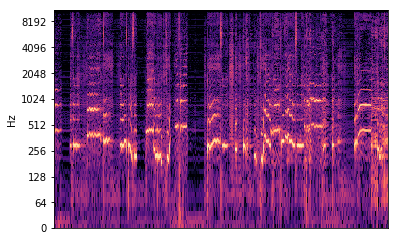

epoch 5/100, loss 0.012507462874054909
epoch 5/100, loss 0.01937180757522583
epoch 5/100, loss 0.01432039588689804
epoch 5/100, loss 0.015726670622825623
epoch 5/100, loss 0.022237373515963554
epoch 5/100, loss 0.017537632957100868
epoch 5/100, loss 0.012490428052842617
epoch 5/100, loss 0.018820734694600105
epoch 5/100, loss 0.012411489151418209
epoch 5/100, loss 0.02176760509610176
epoch 5/100, loss 0.017951667308807373
epoch 5/100, loss 0.021057255566120148
epoch 5/100, loss 0.02371346764266491
epoch 5/100, loss 0.018992669880390167
epoch 5/100, loss 0.019001025706529617
epoch 5/100, loss 0.02259797602891922
epoch 5/100, loss 0.023272287100553513
epoch 5/100, loss 0.010319997556507587
epoch 5/100, loss 0.018221795558929443
epoch 5/100, loss 0.018117276951670647
epoch 5/100, loss 0.021344944834709167
epoch 5/100, loss 0.020385436713695526
epoch 5/100, loss 0.015009253285825253
epoch 5/100, loss 0.01238684169948101
epoch 5/100, loss 0.018415654078125954
epoch 5/100, loss 0.02356647886

epoch 5/100, loss 0.02013915218412876
epoch 5/100, loss 0.01164199598133564
epoch 5/100, loss 0.014977417886257172
epoch 5/100, loss 0.01819964125752449
epoch 5/100, loss 0.024951227009296417
epoch 5/100, loss 0.015876224264502525
epoch 5/100, loss 0.013781378045678139
epoch 5/100, loss 0.012303771451115608
epoch 5/100, loss 0.013753867708146572
epoch 5/100, loss 0.02222239412367344
epoch 5/100, loss 0.009240778163075447
epoch 5/100, loss 0.014698260463774204
epoch 5/100, loss 0.01636778563261032
epoch 5/100, loss 0.016249246895313263
epoch 5/100, loss 0.018703190609812737
epoch 5/100, loss 0.013044417835772038
epoch 5/100, loss 0.019656816497445107
epoch 5/100, loss 0.01371743343770504
epoch 5/100, loss 0.018958501517772675
epoch 5/100, loss 0.01815275102853775
epoch 5/100, loss 0.01598469167947769
epoch 5/100, loss 0.02118857391178608
epoch 5/100, loss 0.021533407270908356
epoch 5/100, loss 0.0228751040995121
epoch 5/100, loss 0.016060220077633858
epoch 5/100, loss 0.0143691934645175

epoch 5/100, loss 0.022596754133701324
epoch 5/100, loss 0.017876803874969482
epoch 5/100, loss 0.011814938858151436
epoch 5/100, loss 0.017571404576301575
epoch 5/100, loss 0.019323810935020447
epoch 5/100, loss 0.01868969388306141
epoch 5/100, loss 0.0089914845302701
epoch 5/100, loss 0.016349459066987038
epoch 5/100, loss 0.016062509268522263
epoch 5/100, loss 0.018793005496263504
epoch 5/100, loss 0.011844304390251637
epoch 5/100, loss 0.018253684043884277
epoch 5/100, loss 0.021697919815778732
epoch 5/100, loss 0.013328907079994678
epoch 5/100, loss 0.01874595321714878
epoch 5/100, loss 0.008783605881035328
epoch 5/100, loss 0.01586846448481083
epoch 5/100, loss 0.015323243103921413
epoch 5/100, loss 0.016419637948274612
epoch 5/100, loss 0.02655297890305519
epoch 5/100, loss 0.012042899616062641
epoch 5/100, loss 0.014049018733203411
epoch 5/100, loss 0.017708074301481247
epoch 5/100, loss 0.022516610100865364
epoch 5/100, loss 0.01942579448223114
epoch 5/100, loss 0.010599521920

epoch 5/100, loss 0.021505184471607208
epoch 5/100, loss 0.016681218519806862
epoch 5/100, loss 0.017436303198337555
epoch 5/100, loss 0.020252319052815437
epoch 5/100, loss 0.029542548581957817
epoch 5/100, loss 0.013312047347426414
epoch 5/100, loss 0.012536539696156979
epoch 5/100, loss 0.021077677607536316
epoch 5/100, loss 0.013527218252420425
epoch 5/100, loss 0.016384189948439598
epoch 5/100, loss 0.01681174896657467
epoch 5/100, loss 0.015680743381381035
epoch 5/100, loss 0.018178343772888184
epoch 5/100, loss 0.02398618496954441
epoch 5/100, loss 0.021398065611720085
epoch 5/100, loss 0.015496660023927689
epoch 5/100, loss 0.02311236411333084
epoch 5/100, loss 0.015146544203162193
epoch 5/100, loss 0.020969916135072708
epoch 5/100, loss 0.02342848666012287
epoch 5/100, loss 0.019265206530690193
epoch 5/100, loss 0.017748473212122917
epoch 5/100, loss 0.022982506081461906
epoch 5/100, loss 0.011201051063835621
epoch 5/100, loss 0.02092297002673149
epoch 5/100, loss 0.0170042458

epoch 5/100, loss 0.020937403663992882
epoch 5/100, loss 0.017103366553783417
epoch 5/100, loss 0.020384250208735466
epoch 5/100, loss 0.014026581309735775
epoch 5/100, loss 0.016678741201758385
epoch 5/100, loss 0.021173039451241493
epoch 5/100, loss 0.01774407923221588
epoch 5/100, loss 0.022824930027127266
epoch 5/100, loss 0.024265339598059654
epoch 5/100, loss 0.02005692757666111
epoch 5/100, loss 0.011277069337666035
epoch 5/100, loss 0.0186972226947546
epoch 5/100, loss 0.01552983745932579
epoch 5/100, loss 0.01400576252490282
epoch 5/100, loss 0.01643536053597927
epoch 5/100, loss 0.01405545137822628
epoch 5/100, loss 0.024961838498711586
epoch 5/100, loss 0.016372015699744225
epoch 5/100, loss 0.02048768475651741
epoch 5/100, loss 0.014332342892885208
epoch 5/100, loss 0.015344284474849701
epoch 5/100, loss 0.01673322357237339
epoch 5/100, loss 0.018258392810821533
epoch 5/100, loss 0.01470091100782156
epoch 5/100, loss 0.01894131489098072
epoch 5/100, loss 0.01927686855196952

epoch 5/100, loss 0.02218015491962433
epoch 5/100, loss 0.02066624164581299
epoch 5/100, loss 0.013381287455558777
epoch 5/100, loss 0.012123635970056057
epoch 5/100, loss 0.013504093512892723
epoch 5/100, loss 0.017598159611225128
epoch 5/100, loss 0.032222360372543335
epoch 5/100, loss 0.011517091654241085
epoch 5/100, loss 0.019589947536587715
epoch 5/100, loss 0.014900862239301205
epoch 5/100, loss 0.017857005819678307
epoch 5/100, loss 0.016087640076875687
epoch 5/100, loss 0.013342547230422497
epoch 5/100, loss 0.015787815675139427
epoch 5/100, loss 0.015796978026628494
epoch 5/100, loss 0.01593540422618389
epoch 5/100, loss 0.012875670567154884
epoch 5/100, loss 0.013804735615849495
epoch 5/100, loss 0.01653972826898098
epoch 5/100, loss 0.010452216491103172
epoch 5/100, loss 0.015864793211221695
epoch 5/100, loss 0.015584773384034634
epoch 5/100, loss 0.019155999645590782
epoch 5/100, loss 0.013541298918426037
epoch 5/100, loss 0.02437497116625309
epoch 5/100, loss 0.0142130805

epoch 5/100, loss 0.04037114605307579
epoch 5/100, loss 0.011289713904261589
epoch 5/100, loss 0.026897376403212547
epoch 5/100, loss 0.01275723334401846
epoch 5/100, loss 0.014454244635999203
epoch 5/100, loss 0.02046141028404236
epoch 5/100, loss 0.019898120313882828
epoch 5/100, loss 0.02354593575000763
epoch 5/100, loss 0.02160346694290638
epoch 5/100, loss 0.020077988505363464
epoch 5/100, loss 0.021493444219231606
epoch 5/100, loss 0.014056452549993992
epoch 5/100, loss 0.015502462163567543
epoch 5/100, loss 0.016754332929849625
epoch 5/100, loss 0.01588856428861618
epoch 5/100, loss 0.01990237832069397
epoch 5/100, loss 0.022420762106776237
epoch 5/100, loss 0.03283446282148361
epoch 5/100, loss 0.01842770166695118
epoch 5/100, loss 0.013977096416056156
epoch 5/100, loss 0.013872617855668068
epoch 5/100, loss 0.018097029998898506
epoch 5/100, loss 0.023493174463510513
epoch 5/100, loss 0.016578681766986847
epoch 5/100, loss 0.015822548419237137
epoch 5/100, loss 0.01304843556135

epoch 6/100, loss 0.014931755140423775
epoch 6/100, loss 0.014250174164772034
epoch 6/100, loss 0.02251860871911049
epoch 6/100, loss 0.013016372919082642
epoch 6/100, loss 0.013329018838703632
epoch 6/100, loss 0.016803499311208725
epoch 6/100, loss 0.014885436743497849
epoch 6/100, loss 0.013144406490027905
epoch 6/100, loss 0.023299966007471085
epoch 6/100, loss 0.019315969198942184
epoch 6/100, loss 0.01258849911391735
epoch 6/100, loss 0.015549530275166035
epoch 6/100, loss 0.014936058782041073
epoch 6/100, loss 0.013292800635099411
epoch 6/100, loss 0.012369385920464993
epoch 6/100, loss 0.01245725154876709
epoch 6/100, loss 0.018602030351758003
epoch 6/100, loss 0.019153010100126266
epoch 6/100, loss 0.014439763501286507
epoch 6/100, loss 0.022728797048330307
epoch 6/100, loss 0.013244912028312683
epoch 6/100, loss 0.011237766593694687
epoch 6/100, loss 0.012708432972431183
epoch 6/100, loss 0.017578059807419777
epoch 6/100, loss 0.014863649383187294
epoch 6/100, loss 0.01077219

epoch 6/100, loss 0.014593593776226044
epoch 6/100, loss 0.015108576975762844
epoch 6/100, loss 0.01466850470751524
epoch 6/100, loss 0.020310070365667343
epoch 6/100, loss 0.010167715139687061
epoch 6/100, loss 0.02275754325091839
epoch 6/100, loss 0.014457045122981071
epoch 6/100, loss 0.014623371884226799
epoch 6/100, loss 0.01706474833190441
epoch 6/100, loss 0.02214900776743889
epoch 6/100, loss 0.021319087594747543
epoch 6/100, loss 0.016675828024744987
epoch 6/100, loss 0.017226355150341988
epoch 6/100, loss 0.013569813221693039
epoch 6/100, loss 0.01781701110303402
epoch 6/100, loss 0.016301017254590988
epoch 6/100, loss 0.013335573486983776
epoch 6/100, loss 0.019260244444012642
epoch 6/100, loss 0.02112175151705742
epoch 6/100, loss 0.01946788839995861
epoch 6/100, loss 0.01680539920926094
epoch 6/100, loss 0.014943979680538177
epoch 6/100, loss 0.013439318165183067
epoch 6/100, loss 0.01197508629411459
epoch 6/100, loss 0.014527307823300362
epoch 6/100, loss 0.01809312216937

epoch 6/100, loss 0.017116479575634003
epoch 6/100, loss 0.01505831629037857
epoch 6/100, loss 0.013086856342852116
epoch 6/100, loss 0.012451482005417347
epoch 6/100, loss 0.019773580133914948
epoch 6/100, loss 0.02230350859463215
epoch 6/100, loss 0.013938863761723042
epoch 6/100, loss 0.01530480943620205
epoch 6/100, loss 0.02318568527698517
epoch 6/100, loss 0.014628284610807896
epoch 6/100, loss 0.02554977871477604
epoch 6/100, loss 0.015947256237268448
epoch 6/100, loss 0.01708918996155262
epoch 6/100, loss 0.0173969566822052
epoch 6/100, loss 0.018463991582393646
epoch 6/100, loss 0.019023941829800606
epoch 6/100, loss 0.015035675838589668
epoch 6/100, loss 0.01744152419269085
epoch 6/100, loss 0.020510239526629448
epoch 6/100, loss 0.01941327005624771
epoch 6/100, loss 0.014308353886008263
epoch 6/100, loss 0.018926329910755157
epoch 6/100, loss 0.01779427006840706
epoch 6/100, loss 0.01303146593272686
epoch 6/100, loss 0.01732749305665493
epoch 6/100, loss 0.020338723435997963

epoch 6/100, loss 0.021712467074394226
epoch 6/100, loss 0.017450304701924324
epoch 6/100, loss 0.013187950477004051
epoch 6/100, loss 0.016995064914226532
epoch 6/100, loss 0.01834309659898281
epoch 6/100, loss 0.014154643751680851
epoch 6/100, loss 0.015274482779204845
epoch 6/100, loss 0.00979662872850895
epoch 6/100, loss 0.01611272431910038
epoch 6/100, loss 0.01468308363109827
epoch 6/100, loss 0.015153278596699238
epoch 6/100, loss 0.012679923325777054
epoch 6/100, loss 0.03134036064147949
epoch 6/100, loss 0.01544696744531393
epoch 6/100, loss 0.01959821954369545
epoch 6/100, loss 0.012467513792216778
epoch 6/100, loss 0.016592342406511307
epoch 6/100, loss 0.02068173885345459
epoch 6/100, loss 0.013959178701043129
epoch 6/100, loss 0.018651284277439117
epoch 6/100, loss 0.011447538621723652
epoch 6/100, loss 0.017051206901669502
epoch 6/100, loss 0.018791181966662407
epoch 6/100, loss 0.02136475406587124
epoch 6/100, loss 0.01540416944772005
epoch 6/100, loss 0.024700969457626

epoch 6/100, loss 0.020341888070106506
epoch 6/100, loss 0.010007442906498909
epoch 6/100, loss 0.015477174893021584
epoch 6/100, loss 0.0191065464168787
epoch 6/100, loss 0.016174841672182083
epoch 6/100, loss 0.014151870273053646
epoch 6/100, loss 0.014298932626843452
epoch 6/100, loss 0.02205151505768299
epoch 6/100, loss 0.016477180644869804
epoch 6/100, loss 0.017869705334305763
epoch 6/100, loss 0.02113666571676731
epoch 6/100, loss 0.02078194171190262
epoch 6/100, loss 0.01732639968395233
epoch 6/100, loss 0.018399758264422417
epoch 6/100, loss 0.017053615301847458
epoch 6/100, loss 0.018129972741007805
epoch 6/100, loss 0.021747320890426636
epoch 6/100, loss 0.014649700373411179
epoch 6/100, loss 0.014691846445202827
epoch 6/100, loss 0.019241418689489365
epoch 6/100, loss 0.011638541705906391
epoch 6/100, loss 0.013286157511174679
epoch 6/100, loss 0.02789481356739998
epoch 6/100, loss 0.022376343607902527
epoch 6/100, loss 0.010952080599963665
epoch 6/100, loss 0.016331845894

epoch 6/100, loss 0.014121358282864094
epoch 6/100, loss 0.009184058755636215
epoch 6/100, loss 0.01320172380656004
epoch 6/100, loss 0.017430096864700317
epoch 6/100, loss 0.026143258437514305
epoch 6/100, loss 0.02167060784995556
epoch 6/100, loss 0.011445092968642712
epoch 6/100, loss 0.01654052734375
epoch 6/100, loss 0.02776242233812809
epoch 6/100, loss 0.020239150151610374
epoch 6/100, loss 0.02409512735903263
epoch 6/100, loss 0.020427703857421875
epoch 6/100, loss 0.019804377108812332
epoch 6/100, loss 0.013726829551160336
epoch 6/100, loss 0.01862831600010395
epoch 6/100, loss 0.01441197469830513
epoch 6/100, loss 0.007272122893482447
epoch 6/100, loss 0.018841207027435303
epoch 6/100, loss 0.013297691009938717
epoch 6/100, loss 0.016338353976607323
epoch 6/100, loss 0.023907138034701347
epoch 6/100, loss 0.024274339899420738
epoch 6/100, loss 0.014556117355823517
epoch 6/100, loss 0.021165642887353897
epoch 6/100, loss 0.020919393748044968
epoch 6/100, loss 0.026627572253346

epoch 6/100, loss 0.013176068663597107
epoch 6/100, loss 0.019220244139432907
epoch 6/100, loss 0.012855486012995243
epoch 6/100, loss 0.013708383776247501
epoch 6/100, loss 0.020906813442707062
epoch 6/100, loss 0.010244661010801792
epoch 6/100, loss 0.016798652708530426
epoch 6/100, loss 0.015130195766687393
epoch 6/100, loss 0.029764076694846153
epoch 7/100, loss 0.012887825258076191
epoch 7/100, loss 0.015175468288362026
epoch 7/100, loss 0.019171545282006264
epoch 7/100, loss 0.021194353699684143
epoch 7/100, loss 0.02486230432987213
epoch 7/100, loss 0.014005070552229881
epoch 7/100, loss 0.029361113905906677
epoch 7/100, loss 0.014382102526724339
epoch 7/100, loss 0.019083039835095406
epoch 7/100, loss 0.01946626603603363
epoch 7/100, loss 0.0154765909537673
epoch 7/100, loss 0.015719840303063393
epoch 7/100, loss 0.021339034661650658
epoch 7/100, loss 0.020513271912932396
epoch 7/100, loss 0.02005091868340969
epoch 7/100, loss 0.019611680880188942
epoch 7/100, loss 0.0156376231

epoch 7/100, loss 0.025578603148460388
epoch 7/100, loss 0.030217455700039864
epoch 7/100, loss 0.03009939193725586
epoch 7/100, loss 0.026128649711608887
epoch 7/100, loss 0.014873375184834003
epoch 7/100, loss 0.01791447587311268
epoch 7/100, loss 0.01320309191942215
epoch 7/100, loss 0.012170232832431793
epoch 7/100, loss 0.01669730432331562
epoch 7/100, loss 0.014129025861620903
epoch 7/100, loss 0.026948727667331696
epoch 7/100, loss 0.020594149827957153
epoch 7/100, loss 0.02713102288544178
epoch 7/100, loss 0.02500886097550392
epoch 7/100, loss 0.021435227245092392
epoch 7/100, loss 0.02567705139517784
epoch 7/100, loss 0.021064000204205513
epoch 7/100, loss 0.02140219695866108
epoch 7/100, loss 0.016233479604125023
epoch 7/100, loss 0.032968636602163315
epoch 7/100, loss 0.01503682229667902
epoch 7/100, loss 0.016533227637410164
epoch 7/100, loss 0.011962090618908405
epoch 7/100, loss 0.017845502123236656
epoch 7/100, loss 0.0205451101064682
epoch 7/100, loss 0.0164832361042499

epoch 7/100, loss 0.018904030323028564
epoch 7/100, loss 0.016201237216591835
epoch 7/100, loss 0.015053525567054749
epoch 7/100, loss 0.016701674088835716
epoch 7/100, loss 0.017833730205893517
epoch 7/100, loss 0.022842779755592346
epoch 7/100, loss 0.014117433689534664
epoch 7/100, loss 0.013800028711557388
epoch 7/100, loss 0.017887471243739128
epoch 7/100, loss 0.017800208181142807
epoch 7/100, loss 0.01200785767287016
epoch 7/100, loss 0.014555541798472404
epoch 7/100, loss 0.02151365764439106
epoch 7/100, loss 0.009529738686978817
epoch 7/100, loss 0.01344338059425354
epoch 7/100, loss 0.0190447848290205
epoch 7/100, loss 0.014079001732170582
epoch 7/100, loss 0.01900538243353367
epoch 7/100, loss 0.010470816865563393
epoch 7/100, loss 0.018271472305059433
epoch 7/100, loss 0.019439034163951874
epoch 7/100, loss 0.022666793316602707
epoch 7/100, loss 0.021506423130631447
epoch 7/100, loss 0.013400104828178883
epoch 7/100, loss 0.01565534435212612
epoch 7/100, loss 0.014468837529

epoch 7/100, loss 0.016463465988636017
epoch 7/100, loss 0.010533680208027363
epoch 7/100, loss 0.01661798357963562
epoch 7/100, loss 0.018528714776039124
epoch 7/100, loss 0.027804654091596603
epoch 7/100, loss 0.012852586805820465
epoch 7/100, loss 0.016917197033762932
epoch 7/100, loss 0.00964901503175497
epoch 7/100, loss 0.014403214678168297
epoch 7/100, loss 0.01607736200094223
epoch 7/100, loss 0.01577736623585224
epoch 7/100, loss 0.0195804201066494
epoch 7/100, loss 0.015895314514636993
epoch 7/100, loss 0.0123076057061553
epoch 7/100, loss 0.008218108676373959
epoch 7/100, loss 0.015913477167487144
epoch 7/100, loss 0.02053358033299446
epoch 7/100, loss 0.013790559954941273
epoch 7/100, loss 0.016698023304343224
epoch 7/100, loss 0.015775715932250023
epoch 7/100, loss 0.016122745350003242
epoch 7/100, loss 0.013728133402764797
epoch 7/100, loss 0.020741084590554237
epoch 7/100, loss 0.015357057563960552
epoch 7/100, loss 0.013060788623988628
epoch 7/100, loss 0.02518651075661

epoch 7/100, loss 0.02229122631251812
epoch 7/100, loss 0.013431854546070099
epoch 7/100, loss 0.009813876822590828
epoch 7/100, loss 0.008382352069020271
epoch 7/100, loss 0.02070333994925022
epoch 7/100, loss 0.014794087037444115
epoch 7/100, loss 0.01689772866666317
epoch 7/100, loss 0.012859202921390533
epoch 7/100, loss 0.010755890049040318
epoch 7/100, loss 0.014750927686691284
epoch 7/100, loss 0.01679246313869953
epoch 7/100, loss 0.024972790852189064
epoch 7/100, loss 0.028058286756277084
epoch 7/100, loss 0.01746414788067341
epoch 7/100, loss 0.014313931576907635
epoch 7/100, loss 0.01941072568297386
epoch 7/100, loss 0.020625770092010498
epoch 7/100, loss 0.015879807993769646
epoch 7/100, loss 0.010529831051826477
epoch 7/100, loss 0.016685735434293747
epoch 7/100, loss 0.009551163762807846
epoch 7/100, loss 0.019542653113603592
epoch 7/100, loss 0.018355004489421844
epoch 7/100, loss 0.01713230088353157
epoch 7/100, loss 0.02836967073380947
epoch 7/100, loss 0.0148656116798

epoch 7/100, loss 0.01928751729428768
epoch 7/100, loss 0.010601029731333256
epoch 7/100, loss 0.018445737659931183
epoch 7/100, loss 0.013157634995877743
epoch 7/100, loss 0.011046851985156536
epoch 7/100, loss 0.01689278706908226
epoch 7/100, loss 0.026173291727900505
epoch 7/100, loss 0.01541224680840969
epoch 7/100, loss 0.012679790146648884
epoch 7/100, loss 0.011340358294546604
epoch 7/100, loss 0.014693010598421097
epoch 7/100, loss 0.022288357838988304
epoch 7/100, loss 0.019605770707130432
epoch 7/100, loss 0.014356226660311222
epoch 7/100, loss 0.023492610082030296
epoch 7/100, loss 0.0179294403642416
epoch 7/100, loss 0.01391572691500187
epoch 7/100, loss 0.02286061830818653
epoch 7/100, loss 0.016250696033239365
epoch 7/100, loss 0.014962296932935715
epoch 7/100, loss 0.015342907048761845
epoch 7/100, loss 0.011261899024248123
epoch 7/100, loss 0.018291952088475227
epoch 7/100, loss 0.01390117034316063
epoch 7/100, loss 0.018039802089333534
epoch 7/100, loss 0.0174436867237

epoch 7/100, loss 0.015518643893301487
epoch 7/100, loss 0.014608096331357956
epoch 7/100, loss 0.01217868272215128
epoch 7/100, loss 0.015316116623580456
epoch 7/100, loss 0.01789005473256111
epoch 7/100, loss 0.01258015539497137
epoch 7/100, loss 0.008206325583159924
epoch 7/100, loss 0.019890574738383293
epoch 7/100, loss 0.01874978467822075
epoch 7/100, loss 0.010949427261948586
epoch 7/100, loss 0.012728990986943245
epoch 7/100, loss 0.013765105046331882
epoch 7/100, loss 0.018244544044137
epoch 7/100, loss 0.017882995307445526
epoch 7/100, loss 0.01605202443897724
epoch 7/100, loss 0.014152527786791325
epoch 7/100, loss 0.01448009628802538
epoch 7/100, loss 0.013982754200696945
epoch 7/100, loss 0.01299735251814127
epoch 7/100, loss 0.009615457616746426
epoch 7/100, loss 0.030137501657009125
epoch 7/100, loss 0.009815126657485962
epoch 7/100, loss 0.02215445041656494
epoch 7/100, loss 0.014893991872668266
epoch 7/100, loss 0.018219271674752235
epoch 7/100, loss 0.0120130637660622

epoch 8/100, loss 0.011236569844186306
epoch 8/100, loss 0.012866772711277008
epoch 8/100, loss 0.0167042538523674
epoch 8/100, loss 0.03401058167219162
epoch 8/100, loss 0.016445167362689972
epoch 8/100, loss 0.01999577134847641
epoch 8/100, loss 0.0166919007897377
epoch 8/100, loss 0.015477343462407589
epoch 8/100, loss 0.010187878273427486
epoch 8/100, loss 0.01035256776958704
epoch 8/100, loss 0.02416284754872322
epoch 8/100, loss 0.017550097778439522
epoch 8/100, loss 0.015055767260491848
epoch 8/100, loss 0.020189829170703888
epoch 8/100, loss 0.017758285626769066
epoch 8/100, loss 0.018925238400697708
epoch 8/100, loss 0.021881103515625
epoch 8/100, loss 0.011584742926061153
epoch 8/100, loss 0.018468398600816727
epoch 8/100, loss 0.009187253192067146
epoch 8/100, loss 0.022887175902724266
epoch 8/100, loss 0.010802127420902252
epoch 8/100, loss 0.015484347008168697
epoch 8/100, loss 0.015221255831420422
epoch 8/100, loss 0.019068855792284012
epoch 8/100, loss 0.0150925209745764

epoch 8/100, loss 0.01343570463359356
epoch 8/100, loss 0.017411164939403534
epoch 8/100, loss 0.015623129904270172
epoch 8/100, loss 0.015740757808089256
epoch 8/100, loss 0.013406774029135704
epoch 8/100, loss 0.01242762990295887
epoch 8/100, loss 0.012652106583118439
epoch 8/100, loss 0.017020294442772865
epoch 8/100, loss 0.015715695917606354
epoch 8/100, loss 0.021067427471280098
epoch 8/100, loss 0.015426825731992722
epoch 8/100, loss 0.012657814659178257
epoch 8/100, loss 0.015850188210606575
epoch 8/100, loss 0.01353742927312851
epoch 8/100, loss 0.017405444756150246
epoch 8/100, loss 0.01485801488161087
epoch 8/100, loss 0.016266195103526115
epoch 8/100, loss 0.013222286477684975
epoch 8/100, loss 0.01143073383718729
epoch 8/100, loss 0.016070544719696045
epoch 8/100, loss 0.01598536968231201
epoch 8/100, loss 0.024111775681376457
epoch 8/100, loss 0.010903733782470226
epoch 8/100, loss 0.014019741676747799
epoch 8/100, loss 0.02099452167749405
epoch 8/100, loss 0.023026853799

epoch 8/100, loss 0.012630107812583447
epoch 8/100, loss 0.016767635941505432
epoch 8/100, loss 0.01459577027708292
epoch 8/100, loss 0.01579725369811058
epoch 8/100, loss 0.023504966869950294
epoch 8/100, loss 0.015466359443962574
epoch 8/100, loss 0.013197947293519974
epoch 8/100, loss 0.01352682150900364
epoch 8/100, loss 0.021997997537255287
epoch 8/100, loss 0.013018949888646603
epoch 8/100, loss 0.02034486085176468
epoch 8/100, loss 0.018452461808919907
epoch 8/100, loss 0.01763230934739113
epoch 8/100, loss 0.028258688747882843
epoch 8/100, loss 0.015537898987531662
epoch 8/100, loss 0.009632457979023457
epoch 8/100, loss 0.019337642937898636
epoch 8/100, loss 0.01461239717900753
epoch 8/100, loss 0.010298212058842182
epoch 8/100, loss 0.013396170921623707
epoch 8/100, loss 0.02280190959572792
epoch 8/100, loss 0.019923588261008263
epoch 8/100, loss 0.01754823699593544
epoch 8/100, loss 0.01479392684996128
epoch 8/100, loss 0.01789308525621891
epoch 8/100, loss 0.014612776227295

epoch 8/100, loss 0.021969616413116455
epoch 8/100, loss 0.018764523789286613
epoch 8/100, loss 0.013492177240550518
epoch 8/100, loss 0.018999043852090836
epoch 8/100, loss 0.015818201005458832
epoch 8/100, loss 0.01474055740982294
epoch 8/100, loss 0.017187856137752533
epoch 8/100, loss 0.019235040992498398
epoch 8/100, loss 0.01826663687825203
epoch 8/100, loss 0.018038969486951828
epoch 8/100, loss 0.013374662958085537
epoch 8/100, loss 0.016355345025658607
epoch 8/100, loss 0.018001681193709373
epoch 8/100, loss 0.011165741831064224
epoch 8/100, loss 0.017114728689193726
epoch 8/100, loss 0.021105032414197922
epoch 8/100, loss 0.015489216893911362
epoch 8/100, loss 0.016039257869124413
epoch 8/100, loss 0.00841302890330553
epoch 8/100, loss 0.02450796589255333
epoch 8/100, loss 0.014639993198215961
epoch 8/100, loss 0.01169238518923521
epoch 8/100, loss 0.013756170868873596
epoch 8/100, loss 0.01490835566073656
epoch 8/100, loss 0.01690087281167507
epoch 8/100, loss 0.016614200547

epoch 8/100, loss 0.024307381361722946
epoch 8/100, loss 0.026247965171933174
epoch 8/100, loss 0.016665872186422348
epoch 8/100, loss 0.023078834637999535
epoch 8/100, loss 0.014881134033203125
epoch 8/100, loss 0.012176692485809326
epoch 8/100, loss 0.015451723709702492
epoch 8/100, loss 0.016524383798241615
epoch 8/100, loss 0.027092505246400833
epoch 8/100, loss 0.02488373965024948
epoch 8/100, loss 0.013068882748484612
epoch 8/100, loss 0.022052690386772156
epoch 8/100, loss 0.015042233280837536
epoch 8/100, loss 0.026176925748586655
epoch 8/100, loss 0.018533948808908463
epoch 8/100, loss 0.016282588243484497
epoch 8/100, loss 0.019197149202227592
epoch 8/100, loss 0.018512891605496407
epoch 8/100, loss 0.013914123177528381
epoch 8/100, loss 0.012708946131169796
epoch 8/100, loss 0.01634693145751953
epoch 8/100, loss 0.01697493903338909
epoch 8/100, loss 0.026290856301784515
epoch 8/100, loss 0.021658917888998985
epoch 8/100, loss 0.006863805931061506
epoch 8/100, loss 0.01864528

epoch 8/100, loss 0.0130671551451087
epoch 8/100, loss 0.00952158309519291
epoch 8/100, loss 0.017060214653611183
epoch 8/100, loss 0.009639699012041092
epoch 8/100, loss 0.015532034449279308
epoch 8/100, loss 0.025710411369800568
epoch 8/100, loss 0.01356623787432909
epoch 8/100, loss 0.014594604261219501
epoch 8/100, loss 0.022322505712509155
epoch 8/100, loss 0.016358565539121628
epoch 8/100, loss 0.014350258745253086
epoch 8/100, loss 0.021906817331910133
epoch 8/100, loss 0.010855522938072681
epoch 8/100, loss 0.026435542851686478
epoch 8/100, loss 0.015572612173855305
epoch 8/100, loss 0.01338264998048544
epoch 8/100, loss 0.016092386096715927
epoch 8/100, loss 0.013718132860958576
epoch 8/100, loss 0.012312026694417
epoch 8/100, loss 0.013684106059372425
epoch 8/100, loss 0.014819989912211895
epoch 8/100, loss 0.0156790092587471
epoch 8/100, loss 0.01889036037027836
epoch 8/100, loss 0.014870859682559967
epoch 8/100, loss 0.021145550534129143
epoch 8/100, loss 0.0211180094629526

epoch 8/100, loss 0.013288686983287334
epoch 8/100, loss 0.06163336709141731
epoch 8/100, loss 0.022838782519102097
epoch 8/100, loss 0.011606050655245781
epoch 8/100, loss 0.020523004233837128
epoch 8/100, loss 0.01852286048233509
epoch 8/100, loss 0.022589752450585365
epoch 8/100, loss 0.008930518291890621
epoch 8/100, loss 0.02118035778403282
epoch 8/100, loss 0.013083435595035553
epoch 8/100, loss 0.016466237604618073
epoch 8/100, loss 0.27133145928382874
epoch 8/100, loss 0.015939785167574883
epoch 8/100, loss 0.01230564434081316
epoch 8/100, loss 0.016159549355506897
epoch 8/100, loss 0.015627682209014893
epoch 8/100, loss 0.02263154275715351
epoch 8/100, loss 0.02574731968343258
epoch 8/100, loss 0.025137703865766525
epoch 8/100, loss 0.036932818591594696
epoch 8/100, loss 0.02935422584414482
epoch 8/100, loss 0.01792084239423275
epoch 8/100, loss 0.040439825505018234
epoch 9/100, loss 0.01565895788371563
epoch 9/100, loss 0.022719107568264008
epoch 9/100, loss 0.023474890738725

epoch 9/100, loss 0.01842469349503517
epoch 9/100, loss 0.02065267600119114
epoch 9/100, loss 0.02320181392133236
epoch 9/100, loss 0.010858754627406597
epoch 9/100, loss 0.010341822169721127
epoch 9/100, loss 0.015045726671814919
epoch 9/100, loss 0.01022289041429758
epoch 9/100, loss 0.01905423030257225
epoch 9/100, loss 0.01608758233487606
epoch 9/100, loss 0.022249862551689148
epoch 9/100, loss 0.018991516903042793
epoch 9/100, loss 0.022341279312968254
epoch 9/100, loss 0.01860734261572361
epoch 9/100, loss 0.012558192014694214
epoch 9/100, loss 0.010838652029633522
epoch 9/100, loss 0.012765339575707912
epoch 9/100, loss 0.020148927345871925
epoch 9/100, loss 0.01770075038075447
epoch 9/100, loss 0.011854862794280052
epoch 9/100, loss 0.01750071346759796
epoch 9/100, loss 0.01614471897482872
epoch 9/100, loss 0.011624103412032127
epoch 9/100, loss 0.0176004096865654
epoch 9/100, loss 0.012301175855100155
epoch 9/100, loss 0.014936011284589767
epoch 9/100, loss 0.02248427830636501

epoch 9/100, loss 0.012944626621901989
epoch 9/100, loss 0.015361891128122807
epoch 9/100, loss 0.02069985307753086
epoch 9/100, loss 0.01520546805113554
epoch 9/100, loss 0.019688602536916733
epoch 9/100, loss 0.015662262216210365
epoch 9/100, loss 0.010874549858272076
epoch 9/100, loss 0.010225648060441017
epoch 9/100, loss 0.010745435953140259
epoch 9/100, loss 0.01608620211482048
epoch 9/100, loss 0.013024022802710533
epoch 9/100, loss 0.011906659230589867
epoch 9/100, loss 0.016517436131834984
epoch 9/100, loss 0.017279477789998055
epoch 9/100, loss 0.012431234121322632
epoch 9/100, loss 0.01705845817923546
epoch 9/100, loss 0.01454369630664587
epoch 9/100, loss 0.014667913317680359
epoch 9/100, loss 0.021881889551877975
epoch 9/100, loss 0.015395842492580414
epoch 9/100, loss 0.016619326546788216
epoch 9/100, loss 0.011938872747123241
epoch 9/100, loss 0.01508865226060152
epoch 9/100, loss 0.013163209892809391
epoch 9/100, loss 0.012140312232077122
epoch 9/100, loss 0.01476675271

epoch 9/100, loss 0.012118544429540634
epoch 9/100, loss 0.013640251010656357
epoch 9/100, loss 0.015074601396918297
epoch 9/100, loss 0.026555633172392845
epoch 9/100, loss 0.016729727387428284
epoch 9/100, loss 0.019069209694862366
epoch 9/100, loss 0.018623195588588715
epoch 9/100, loss 0.014478936791419983
epoch 9/100, loss 0.02049056626856327
epoch 9/100, loss 0.019872916862368584
epoch 9/100, loss 0.021622056141495705
epoch 9/100, loss 0.014786980114877224
epoch 9/100, loss 0.015956012532114983
epoch 9/100, loss 0.01316151488572359
epoch 9/100, loss 0.019242707639932632
epoch 9/100, loss 0.013658064417541027
epoch 9/100, loss 0.013612424954771996
epoch 9/100, loss 0.01627476140856743
epoch 9/100, loss 0.011830346658825874
epoch 9/100, loss 0.017024150118231773
epoch 9/100, loss 0.017288222908973694
epoch 9/100, loss 0.023762527853250504
epoch 9/100, loss 0.0140016945078969
epoch 9/100, loss 0.012358926236629486
epoch 9/100, loss 0.015431039035320282
epoch 9/100, loss 0.0123048955

epoch 9/100, loss 0.015822632238268852
epoch 9/100, loss 0.021380765363574028
epoch 9/100, loss 0.017472611740231514
epoch 9/100, loss 0.0156853049993515
epoch 9/100, loss 0.015920817852020264
epoch 9/100, loss 0.01079358346760273
epoch 9/100, loss 0.012483838945627213
epoch 9/100, loss 0.009502934291958809
epoch 9/100, loss 0.02857784926891327
epoch 9/100, loss 0.015158968977630138
epoch 9/100, loss 0.011706700548529625
epoch 9/100, loss 0.012527529150247574
epoch 9/100, loss 0.010458949953317642
epoch 9/100, loss 0.01406338531523943
epoch 9/100, loss 0.015603052452206612
epoch 9/100, loss 0.017674943432211876
epoch 9/100, loss 0.018196718767285347
epoch 9/100, loss 0.01712089776992798
epoch 9/100, loss 0.013606096617877483
epoch 9/100, loss 0.012595541775226593
epoch 9/100, loss 0.009913958609104156
epoch 9/100, loss 0.015555924735963345
epoch 9/100, loss 0.02881116420030594
epoch 9/100, loss 0.012324520386755466
epoch 9/100, loss 0.010525427758693695
epoch 9/100, loss 0.015120203606

epoch 9/100, loss 0.023842357099056244
epoch 9/100, loss 0.016956361010670662
epoch 9/100, loss 0.016807427629828453
epoch 9/100, loss 0.018495211377739906
epoch 9/100, loss 0.024113504216074944
epoch 9/100, loss 0.01667274348437786
epoch 9/100, loss 0.013042912818491459
epoch 9/100, loss 0.01413044985383749
epoch 9/100, loss 0.020166944712400436
epoch 9/100, loss 0.01677592471241951
epoch 9/100, loss 0.011149157769978046
epoch 9/100, loss 0.013911917805671692
epoch 9/100, loss 0.021074844524264336
epoch 9/100, loss 0.018783841282129288
epoch 9/100, loss 0.01252390630543232
epoch 9/100, loss 0.014068924821913242
epoch 9/100, loss 0.0210906770080328
epoch 9/100, loss 0.014479517005383968
epoch 9/100, loss 0.0187948327511549
epoch 9/100, loss 0.02143821306526661
epoch 9/100, loss 0.022163834422826767
epoch 9/100, loss 0.015584437176585197
epoch 9/100, loss 0.011317017488181591
epoch 9/100, loss 0.023001056164503098
epoch 9/100, loss 0.016944531351327896
epoch 9/100, loss 0.03108352422714

epoch 9/100, loss 0.012733101844787598
epoch 9/100, loss 0.024970443919301033
epoch 9/100, loss 0.012499969452619553
epoch 9/100, loss 0.017440777271986008
epoch 9/100, loss 0.011136532761156559
epoch 9/100, loss 0.01707560010254383
epoch 9/100, loss 0.015753546729683876
epoch 9/100, loss 0.017004430294036865
epoch 9/100, loss 0.02635292522609234
epoch 9/100, loss 0.01368800364434719
epoch 9/100, loss 0.01580885425209999
epoch 9/100, loss 0.018782513216137886
epoch 9/100, loss 0.013696888461709023
epoch 9/100, loss 0.010909364558756351
epoch 9/100, loss 0.021339958533644676
epoch 9/100, loss 0.015275594778358936
epoch 9/100, loss 0.013606364838778973
epoch 9/100, loss 0.018409375101327896
epoch 9/100, loss 0.0063478341326117516
epoch 9/100, loss 0.014333901926875114
epoch 9/100, loss 0.008445965126156807
epoch 9/100, loss 0.014131705276668072
epoch 9/100, loss 0.028180554509162903
epoch 9/100, loss 0.01146352756768465
epoch 9/100, loss 0.009206672199070454
epoch 9/100, loss 0.020451776

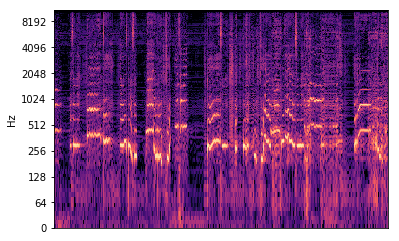

epoch 10/100, loss 0.018555236980319023
epoch 10/100, loss 0.014963715337216854
epoch 10/100, loss 0.02152063511312008
epoch 10/100, loss 0.020578304305672646
epoch 10/100, loss 0.016042059287428856
epoch 10/100, loss 0.017596209421753883
epoch 10/100, loss 0.014397837221622467
epoch 10/100, loss 0.015766067430377007
epoch 10/100, loss 0.022006509825587273
epoch 10/100, loss 0.01597106270492077
epoch 10/100, loss 0.02795497700572014
epoch 10/100, loss 0.017419131472706795
epoch 10/100, loss 0.024710210040211678
epoch 10/100, loss 0.015097267925739288
epoch 10/100, loss 0.012165658175945282
epoch 10/100, loss 0.014376667328178883
epoch 10/100, loss 0.013340831734240055
epoch 10/100, loss 0.016152910888195038
epoch 10/100, loss 0.014298240654170513
epoch 10/100, loss 0.014924452640116215
epoch 10/100, loss 0.01329402532428503
epoch 10/100, loss 0.015562527813017368
epoch 10/100, loss 0.020237110555171967
epoch 10/100, loss 0.01817071996629238
epoch 10/100, loss 0.016722097992897034
epoch

epoch 10/100, loss 0.01180446706712246
epoch 10/100, loss 0.009605464525520802
epoch 10/100, loss 0.01129222847521305
epoch 10/100, loss 0.016724735498428345
epoch 10/100, loss 0.017052914947271347
epoch 10/100, loss 0.01587049663066864
epoch 10/100, loss 0.016454588621854782
epoch 10/100, loss 0.015798667445778847
epoch 10/100, loss 0.00881646666675806
epoch 10/100, loss 0.018426787108182907
epoch 10/100, loss 0.017698390409350395
epoch 10/100, loss 0.02014484629034996
epoch 10/100, loss 0.014703947119414806
epoch 10/100, loss 0.022307531908154488
epoch 10/100, loss 0.011664294637739658
epoch 10/100, loss 0.020396586507558823
epoch 10/100, loss 0.02157922461628914
epoch 10/100, loss 0.01967507228255272
epoch 10/100, loss 0.01738748326897621
epoch 10/100, loss 0.01624838262796402
epoch 10/100, loss 0.015738917514681816
epoch 10/100, loss 0.018323102965950966
epoch 10/100, loss 0.016063278540968895
epoch 10/100, loss 0.01824466697871685
epoch 10/100, loss 0.00819158274680376
epoch 10/10

epoch 10/100, loss 0.01084620039910078
epoch 10/100, loss 0.020828569307923317
epoch 10/100, loss 0.01702316477894783
epoch 10/100, loss 0.013554790988564491
epoch 10/100, loss 0.011649014428257942
epoch 10/100, loss 0.01072743535041809
epoch 10/100, loss 0.018717486411333084
epoch 10/100, loss 0.019823487848043442
epoch 10/100, loss 0.018127866089344025
epoch 10/100, loss 0.017641669139266014
epoch 10/100, loss 0.015005815774202347
epoch 10/100, loss 0.015897497534751892
epoch 10/100, loss 0.01664823107421398
epoch 10/100, loss 0.017736755311489105
epoch 10/100, loss 0.01869136467576027
epoch 10/100, loss 0.0161258727312088
epoch 10/100, loss 0.015349498949944973
epoch 10/100, loss 0.010275688022375107
epoch 10/100, loss 0.014288293197751045
epoch 10/100, loss 0.011675485409796238
epoch 10/100, loss 0.013185041025280952
epoch 10/100, loss 0.013930696062743664
epoch 10/100, loss 0.013189045712351799
epoch 10/100, loss 0.010625713504850864
epoch 10/100, loss 0.009749299846589565
epoch 1

epoch 10/100, loss 0.019597478210926056
epoch 10/100, loss 0.015421043150126934
epoch 10/100, loss 0.019624045118689537
epoch 10/100, loss 0.014861545525491238
epoch 10/100, loss 0.020318077877163887
epoch 10/100, loss 0.016403866931796074
epoch 10/100, loss 0.014380707405507565
epoch 10/100, loss 0.021507784724235535
epoch 10/100, loss 0.014617947861552238
epoch 10/100, loss 0.010656951926648617
epoch 10/100, loss 0.01946895755827427
epoch 10/100, loss 0.02496952749788761
epoch 10/100, loss 0.016533885151147842
epoch 10/100, loss 0.012003551237285137
epoch 10/100, loss 0.012896751053631306
epoch 10/100, loss 0.018459444865584373
epoch 10/100, loss 0.01357161533087492
epoch 10/100, loss 0.009060199372470379
epoch 10/100, loss 0.010427430272102356
epoch 10/100, loss 0.013126833364367485
epoch 10/100, loss 0.019734691828489304
epoch 10/100, loss 0.025268275290727615
epoch 10/100, loss 0.02256966568529606
epoch 10/100, loss 0.013764125294983387
epoch 10/100, loss 0.013600606471300125
epoc

epoch 10/100, loss 0.01466164831072092
epoch 10/100, loss 0.015472027473151684
epoch 10/100, loss 0.017011158168315887
epoch 10/100, loss 0.017804859206080437
epoch 10/100, loss 0.01180756464600563
epoch 10/100, loss 0.015048961155116558
epoch 10/100, loss 0.02212631329894066
epoch 10/100, loss 0.009866693057119846
epoch 10/100, loss 0.018910003826022148
epoch 10/100, loss 0.016448890790343285
epoch 10/100, loss 0.01313654612749815
epoch 10/100, loss 0.01566758006811142
epoch 10/100, loss 0.013672145083546638
epoch 10/100, loss 0.014025055803358555
epoch 10/100, loss 0.014836993999779224
epoch 10/100, loss 0.012890390120446682
epoch 10/100, loss 0.014084909111261368
epoch 10/100, loss 0.01954624056816101
epoch 10/100, loss 0.026664232835173607
epoch 10/100, loss 0.01455443911254406
epoch 10/100, loss 0.011117556132376194
epoch 10/100, loss 0.01709645241498947
epoch 10/100, loss 0.016982801258563995
epoch 10/100, loss 0.019971096888184547
epoch 10/100, loss 0.00967150554060936
epoch 10/

epoch 10/100, loss 0.021657168865203857
epoch 10/100, loss 0.014215022325515747
epoch 10/100, loss 0.01371163409203291
epoch 10/100, loss 0.011456351727247238
epoch 10/100, loss 0.015739792957901955
epoch 10/100, loss 0.017112480476498604
epoch 10/100, loss 0.025769483298063278
epoch 10/100, loss 0.012261554598808289
epoch 10/100, loss 0.01738731563091278
epoch 10/100, loss 0.015554782934486866
epoch 10/100, loss 0.021488472819328308
epoch 10/100, loss 0.008503053337335587
epoch 10/100, loss 0.015044078230857849
epoch 10/100, loss 0.01486244983971119
epoch 10/100, loss 0.015286250971257687
epoch 10/100, loss 0.02046300657093525
epoch 10/100, loss 0.012568207457661629
epoch 10/100, loss 0.01648528315126896
epoch 10/100, loss 0.01129888091236353
epoch 10/100, loss 0.008638123981654644
epoch 10/100, loss 0.015487659722566605
epoch 10/100, loss 0.01724305935204029
epoch 10/100, loss 0.012109044939279556
epoch 10/100, loss 0.016888469457626343
epoch 10/100, loss 0.013015322387218475
epoch 1

epoch 10/100, loss 0.01658165268599987
epoch 10/100, loss 0.017268478870391846
epoch 10/100, loss 0.007915736176073551
epoch 10/100, loss 0.016982268542051315
epoch 10/100, loss 0.019350409507751465
epoch 10/100, loss 0.01676626317203045
epoch 10/100, loss 0.011339359916746616
epoch 10/100, loss 0.012633328326046467
epoch 10/100, loss 0.01469341665506363
epoch 10/100, loss 0.011047178879380226
epoch 10/100, loss 0.02381621114909649
epoch 10/100, loss 0.017710691317915916
epoch 10/100, loss 0.01441306620836258
epoch 10/100, loss 0.0183106679469347
epoch 10/100, loss 0.017272191122174263
epoch 10/100, loss 0.015635507181286812
epoch 10/100, loss 0.013487007468938828
epoch 10/100, loss 0.02148864045739174
epoch 10/100, loss 0.025936855003237724
epoch 10/100, loss 0.01689184457063675
epoch 10/100, loss 0.01401458214968443
epoch 10/100, loss 0.010114272125065327
epoch 10/100, loss 0.015860136598348618
epoch 10/100, loss 0.016439884901046753
epoch 10/100, loss 0.01139877736568451
epoch 10/10

epoch 11/100, loss 0.0103280795738101
epoch 11/100, loss 0.013759885914623737
epoch 11/100, loss 0.014243965037167072
epoch 11/100, loss 0.030219806358218193
epoch 11/100, loss 0.026415999978780746
epoch 11/100, loss 0.01939748227596283
epoch 11/100, loss 0.013787936419248581
epoch 11/100, loss 0.018006857484579086
epoch 11/100, loss 0.022560883313417435
epoch 11/100, loss 0.023180050775408745
epoch 11/100, loss 0.03541406989097595
epoch 11/100, loss 0.06869182735681534
epoch 11/100, loss 0.02142976224422455
epoch 11/100, loss 0.02947242185473442
epoch 11/100, loss 0.022890456020832062
epoch 11/100, loss 0.01653912290930748
epoch 11/100, loss 0.014750088565051556
epoch 11/100, loss 0.02274877205491066
epoch 11/100, loss 0.020199576392769814
epoch 11/100, loss 0.014700157567858696
epoch 11/100, loss 0.016312435269355774
epoch 11/100, loss 0.023163912817835808
epoch 11/100, loss 0.014811627566814423
epoch 11/100, loss 0.013730866834521294
epoch 11/100, loss 0.021480530500411987
epoch 11/

epoch 11/100, loss 0.02090267837047577
epoch 11/100, loss 0.01599941961467266
epoch 11/100, loss 0.018211398273706436
epoch 11/100, loss 0.02049049735069275
epoch 11/100, loss 0.015507921576499939
epoch 11/100, loss 0.017968585714697838
epoch 11/100, loss 0.01579449698328972
epoch 11/100, loss 0.011418873444199562
epoch 11/100, loss 0.01124731358140707
epoch 11/100, loss 0.01466770563274622
epoch 11/100, loss 0.00849447026848793
epoch 11/100, loss 0.018714653328061104
epoch 11/100, loss 0.019119612872600555
epoch 11/100, loss 0.017944928258657455
epoch 11/100, loss 0.01771075651049614
epoch 11/100, loss 0.01979731395840645
epoch 11/100, loss 0.012761406600475311
epoch 11/100, loss 0.01401665061712265
epoch 11/100, loss 0.017048882320523262
epoch 11/100, loss 0.012876739725470543
epoch 11/100, loss 0.009041214361786842
epoch 11/100, loss 0.012901515699923038
epoch 11/100, loss 0.013033928349614143
epoch 11/100, loss 0.011484547518193722
epoch 11/100, loss 0.011285321786999702
epoch 11/1

epoch 11/100, loss 0.017451029270887375
epoch 11/100, loss 0.012454531155526638
epoch 11/100, loss 0.014551202766597271
epoch 11/100, loss 0.011488081887364388
epoch 11/100, loss 0.019510913640260696
epoch 11/100, loss 0.02465752698481083
epoch 11/100, loss 0.024518361315131187
epoch 11/100, loss 0.021188441663980484
epoch 11/100, loss 0.017546603456139565
epoch 11/100, loss 0.012278508394956589
epoch 11/100, loss 0.011371999979019165
epoch 11/100, loss 0.015612130053341389
epoch 11/100, loss 0.01399197056889534
epoch 11/100, loss 0.022325720638036728
epoch 11/100, loss 0.01742241531610489
epoch 11/100, loss 0.01140707265585661
epoch 11/100, loss 0.014941022731363773
epoch 11/100, loss 0.012772330082952976
epoch 11/100, loss 0.020074261352419853
epoch 11/100, loss 0.03775211423635483
epoch 11/100, loss 0.014288404025137424
epoch 11/100, loss 0.011492013931274414
epoch 11/100, loss 0.022206222638487816
epoch 11/100, loss 0.021713843569159508
epoch 11/100, loss 0.018550274893641472
epoch

epoch 11/100, loss 0.016093110665678978
epoch 11/100, loss 0.017700256779789925
epoch 11/100, loss 0.016867894679307938
epoch 11/100, loss 0.019621657207608223
epoch 11/100, loss 0.01075920183211565
epoch 11/100, loss 0.011891288682818413
epoch 11/100, loss 0.011946271173655987
epoch 11/100, loss 0.01268716435879469
epoch 11/100, loss 0.02376944199204445
epoch 11/100, loss 0.014859702438116074
epoch 11/100, loss 0.013257626444101334
epoch 11/100, loss 0.02771998941898346
epoch 11/100, loss 0.01723380573093891
epoch 11/100, loss 0.014975990168750286
epoch 11/100, loss 0.022834040224552155
epoch 11/100, loss 0.016557632014155388
epoch 11/100, loss 0.01708587072789669
epoch 11/100, loss 0.013871381990611553
epoch 11/100, loss 0.011528671719133854
epoch 11/100, loss 0.016921978443861008
epoch 11/100, loss 0.010800696909427643
epoch 11/100, loss 0.019111867994070053
epoch 11/100, loss 0.015120542608201504
epoch 11/100, loss 0.012292643077671528
epoch 11/100, loss 0.0151985427364707
epoch 11

epoch 11/100, loss 0.013308307155966759
epoch 11/100, loss 0.013914034701883793
epoch 11/100, loss 0.012314045801758766
epoch 11/100, loss 0.017533792182803154
epoch 11/100, loss 0.013914554379880428
epoch 11/100, loss 0.014696352183818817
epoch 11/100, loss 0.015378178097307682
epoch 11/100, loss 0.01669112592935562
epoch 11/100, loss 0.021615365520119667
epoch 11/100, loss 0.01661086082458496
epoch 11/100, loss 0.012322376482188702
epoch 11/100, loss 0.011930380947887897
epoch 11/100, loss 0.01641499437391758
epoch 11/100, loss 0.011602746322751045
epoch 11/100, loss 0.02030627802014351
epoch 11/100, loss 0.019781749695539474
epoch 11/100, loss 0.019161995500326157
epoch 11/100, loss 0.01667441986501217
epoch 11/100, loss 0.01773574762046337
epoch 11/100, loss 0.010883576236665249
epoch 11/100, loss 0.014578865841031075
epoch 11/100, loss 0.01842232048511505
epoch 11/100, loss 0.013167629018425941
epoch 11/100, loss 0.013884919695556164
epoch 11/100, loss 0.016126729547977448
epoch 1

epoch 11/100, loss 0.013524830341339111
epoch 11/100, loss 0.021044503897428513
epoch 11/100, loss 0.010257363319396973
epoch 11/100, loss 0.010867319069802761
epoch 11/100, loss 0.01463345903903246
epoch 11/100, loss 0.02159021981060505
epoch 11/100, loss 0.015347552485764027
epoch 11/100, loss 0.01669531874358654
epoch 11/100, loss 0.01373923197388649
epoch 11/100, loss 0.01668545790016651
epoch 11/100, loss 0.012326687574386597
epoch 11/100, loss 0.014663098379969597
epoch 11/100, loss 0.012817282229661942
epoch 11/100, loss 0.01450707670301199
epoch 11/100, loss 0.012366775423288345
epoch 11/100, loss 0.017358379438519478
epoch 11/100, loss 0.032940179109573364
epoch 11/100, loss 0.014658642932772636
epoch 11/100, loss 0.012431389652192593
epoch 11/100, loss 0.017633486539125443
epoch 11/100, loss 0.019623054191470146
epoch 11/100, loss 0.014350974932312965
epoch 11/100, loss 0.009814032353460789
epoch 11/100, loss 0.013024463318288326
epoch 11/100, loss 0.012364012189209461
epoch 

epoch 11/100, loss 0.0095605393871665
epoch 11/100, loss 0.016508879140019417
epoch 11/100, loss 0.02075132541358471
epoch 11/100, loss 0.016473732888698578
epoch 11/100, loss 0.014375886879861355
epoch 11/100, loss 0.014736168086528778
epoch 11/100, loss 0.012552044354379177
epoch 11/100, loss 0.012175078503787518
epoch 11/100, loss 0.018210342153906822
epoch 11/100, loss 0.015324405394494534
epoch 11/100, loss 0.009304591454565525
epoch 11/100, loss 0.015960916876792908
epoch 11/100, loss 0.014709210954606533
epoch 11/100, loss 0.01804168149828911
epoch 11/100, loss 0.01584436558187008
epoch 11/100, loss 0.013484912924468517
epoch 11/100, loss 0.016369814053177834
epoch 11/100, loss 0.02675791084766388
epoch 11/100, loss 0.011261519975960255
epoch 11/100, loss 0.014400406740605831
epoch 11/100, loss 0.014366504736244678
epoch 11/100, loss 0.013552161864936352
epoch 11/100, loss 0.020957252010703087
epoch 11/100, loss 0.011504550464451313
epoch 11/100, loss 0.014113686978816986
epoch 

epoch 12/100, loss 0.012722834013402462
epoch 12/100, loss 0.01591138169169426
epoch 12/100, loss 0.018225491046905518
epoch 12/100, loss 0.010869682766497135
epoch 12/100, loss 0.013247357681393623
epoch 12/100, loss 0.01849028840661049
epoch 12/100, loss 0.02235838584601879
epoch 12/100, loss 0.015863146632909775
epoch 12/100, loss 0.01364828459918499
epoch 12/100, loss 0.018615176901221275
epoch 12/100, loss 0.014630425721406937
epoch 12/100, loss 0.013661130331456661
epoch 12/100, loss 0.015619289129972458
epoch 12/100, loss 0.020107030868530273
epoch 12/100, loss 0.01130747888237238
epoch 12/100, loss 0.015963857993483543
epoch 12/100, loss 0.022488918155431747
epoch 12/100, loss 0.018141256645321846
epoch 12/100, loss 0.012133889831602573
epoch 12/100, loss 0.011724167503416538
epoch 12/100, loss 0.011983387172222137
epoch 12/100, loss 0.01273034606128931
epoch 12/100, loss 0.029516344889998436
epoch 12/100, loss 0.010099053382873535
epoch 12/100, loss 0.012794352136552334
epoch 

epoch 12/100, loss 0.019206037744879723
epoch 12/100, loss 0.01316000334918499
epoch 12/100, loss 0.017088700085878372
epoch 12/100, loss 0.016412915661931038
epoch 12/100, loss 0.025515124201774597
epoch 12/100, loss 0.014341781847178936
epoch 12/100, loss 0.0207138042896986
epoch 12/100, loss 0.015227099880576134
epoch 12/100, loss 0.016412094235420227
epoch 12/100, loss 0.016160769388079643
epoch 12/100, loss 0.012657350860536098
epoch 12/100, loss 0.00930494163185358
epoch 12/100, loss 0.01678365468978882
epoch 12/100, loss 0.010658376850187778
epoch 12/100, loss 0.017479438334703445
epoch 12/100, loss 0.012003619223833084
epoch 12/100, loss 0.01867845095694065
epoch 12/100, loss 0.013176496140658855
epoch 12/100, loss 0.009635667316615582
epoch 12/100, loss 0.01625535637140274
epoch 12/100, loss 0.020205218344926834
epoch 12/100, loss 0.014713997021317482
epoch 12/100, loss 0.016475066542625427
epoch 12/100, loss 0.01228235475718975
epoch 12/100, loss 0.014548752456903458
epoch 12

epoch 12/100, loss 0.013773657381534576
epoch 12/100, loss 0.013586836867034435
epoch 12/100, loss 0.011248080059885979
epoch 12/100, loss 0.015516309067606926
epoch 12/100, loss 0.023416753858327866
epoch 12/100, loss 0.017788775265216827
epoch 12/100, loss 0.008943332359194756
epoch 12/100, loss 0.01476901862770319
epoch 12/100, loss 0.007288437802344561
epoch 12/100, loss 0.01466299593448639
epoch 12/100, loss 0.02123841643333435
epoch 12/100, loss 0.017087476328015327
epoch 12/100, loss 0.022346507757902145
epoch 12/100, loss 0.025818999856710434
epoch 12/100, loss 0.020937062799930573
epoch 12/100, loss 0.011698609218001366
epoch 12/100, loss 0.014955492690205574
epoch 12/100, loss 0.02081356942653656
epoch 12/100, loss 0.015331570990383625
epoch 12/100, loss 0.013619856908917427
epoch 12/100, loss 0.013002023100852966
epoch 12/100, loss 0.013940814882516861
epoch 12/100, loss 0.017105136066675186
epoch 12/100, loss 0.012591663748025894
epoch 12/100, loss 0.01708650216460228
epoch

epoch 12/100, loss 0.017688347026705742
epoch 12/100, loss 0.01602097600698471
epoch 12/100, loss 0.016940640285611153
epoch 12/100, loss 0.015699997544288635
epoch 12/100, loss 0.018430542200803757
epoch 12/100, loss 0.018151815980672836
epoch 12/100, loss 0.018189508467912674
epoch 12/100, loss 0.010434878058731556
epoch 12/100, loss 0.01144974585622549
epoch 12/100, loss 0.014170707203447819
epoch 12/100, loss 0.013642841018736362
epoch 12/100, loss 0.01762268878519535
epoch 12/100, loss 0.016200123354792595
epoch 12/100, loss 0.012321189977228642
epoch 12/100, loss 0.015138884074985981
epoch 12/100, loss 0.008393931202590466
epoch 12/100, loss 0.014230439439415932
epoch 12/100, loss 0.011279154568910599
epoch 12/100, loss 0.013232982717454433
epoch 12/100, loss 0.013975727371871471
epoch 12/100, loss 0.01763995736837387
epoch 12/100, loss 0.01880473643541336
epoch 12/100, loss 0.014042921364307404
epoch 12/100, loss 0.01936359889805317
epoch 12/100, loss 0.01342635415494442
epoch 1

epoch 12/100, loss 0.018460288643836975
epoch 12/100, loss 0.014006608165800571
epoch 12/100, loss 0.014885500073432922
epoch 12/100, loss 0.015806837007403374
epoch 12/100, loss 0.026656627655029297
epoch 12/100, loss 0.01341733243316412
epoch 12/100, loss 0.016017841175198555
epoch 12/100, loss 0.025103595107793808
epoch 12/100, loss 0.016593322157859802
epoch 12/100, loss 0.014032517559826374
epoch 12/100, loss 0.018324105069041252
epoch 12/100, loss 0.015287552960216999
epoch 12/100, loss 0.010526764206588268
epoch 12/100, loss 0.009838549420237541
epoch 12/100, loss 0.016509486362338066
epoch 12/100, loss 0.013350791297852993
epoch 12/100, loss 0.01736924797296524
epoch 12/100, loss 0.014013873413205147
epoch 12/100, loss 0.024250851944088936
epoch 12/100, loss 0.015879850834608078
epoch 12/100, loss 0.016516726464033127
epoch 12/100, loss 0.009304560720920563
epoch 12/100, loss 0.010069571435451508
epoch 12/100, loss 0.012908841483294964
epoch 12/100, loss 0.015363028272986412
ep

epoch 12/100, loss 0.012913919053971767
epoch 12/100, loss 0.013208807446062565
epoch 12/100, loss 0.013254396617412567
epoch 12/100, loss 0.015487213619053364
epoch 12/100, loss 0.01767130196094513
epoch 12/100, loss 0.023425431922078133
epoch 12/100, loss 0.018509050831198692
epoch 12/100, loss 0.019252480939030647
epoch 12/100, loss 0.012295559048652649
epoch 12/100, loss 0.01176803931593895
epoch 12/100, loss 0.01242663525044918
epoch 12/100, loss 0.024822531268000603
epoch 12/100, loss 0.014038030058145523
epoch 12/100, loss 0.01522101741284132
epoch 12/100, loss 0.01672990433871746
epoch 12/100, loss 0.016428345814347267
epoch 12/100, loss 0.010883098468184471
epoch 12/100, loss 0.02687530405819416
epoch 12/100, loss 0.020373808220028877
epoch 12/100, loss 0.013404454104602337
epoch 12/100, loss 0.014223392121493816
epoch 12/100, loss 0.01615014486014843
epoch 12/100, loss 0.013144411146640778
epoch 12/100, loss 0.014194692485034466
epoch 12/100, loss 0.010737459175288677
epoch 1

epoch 12/100, loss 0.013337143696844578
epoch 12/100, loss 0.018894091248512268
epoch 12/100, loss 0.01576956734061241
epoch 12/100, loss 0.014413361437618732
epoch 12/100, loss 0.021718772128224373
epoch 12/100, loss 0.015048647299408913
epoch 12/100, loss 0.009127124212682247
epoch 13/100, loss 0.012276383116841316
epoch 13/100, loss 0.011774237267673016
epoch 13/100, loss 0.016932306811213493
epoch 13/100, loss 0.01995989680290222
epoch 13/100, loss 0.02292054519057274
epoch 13/100, loss 0.008642582222819328
epoch 13/100, loss 0.014891980215907097
epoch 13/100, loss 0.015401828102767467
epoch 13/100, loss 0.01598258875310421
epoch 13/100, loss 0.013330655172467232
epoch 13/100, loss 0.013244951143860817
epoch 13/100, loss 0.017863407731056213
epoch 13/100, loss 0.016049876809120178
epoch 13/100, loss 0.01635599322617054
epoch 13/100, loss 0.012406629510223866
epoch 13/100, loss 0.012504911981523037
epoch 13/100, loss 0.019209451973438263
epoch 13/100, loss 0.016634764149785042
epoch

epoch 13/100, loss 0.010392215102910995
epoch 13/100, loss 0.011229046620428562
epoch 13/100, loss 0.02131275273859501
epoch 13/100, loss 0.01714683696627617
epoch 13/100, loss 0.01641911454498768
epoch 13/100, loss 0.015155105851590633
epoch 13/100, loss 0.01851056143641472
epoch 13/100, loss 0.020875468850135803
epoch 13/100, loss 0.017979275435209274
epoch 13/100, loss 0.021227646619081497
epoch 13/100, loss 0.015927555039525032
epoch 13/100, loss 0.013765675947070122
epoch 13/100, loss 0.011896834708750248
epoch 13/100, loss 0.0239652618765831
epoch 13/100, loss 0.01627773977816105
epoch 13/100, loss 0.0172580573707819
epoch 13/100, loss 0.01564953848719597
epoch 13/100, loss 0.010118601843714714
epoch 13/100, loss 0.010747211053967476
epoch 13/100, loss 0.013937631621956825
epoch 13/100, loss 0.015479035675525665
epoch 13/100, loss 0.021012132987380028
epoch 13/100, loss 0.014034134335815907
epoch 13/100, loss 0.017522843554615974
epoch 13/100, loss 0.015920057892799377
epoch 13/1

epoch 13/100, loss 0.010938777588307858
epoch 13/100, loss 0.014893676154315472
epoch 13/100, loss 0.010733515955507755
epoch 13/100, loss 0.016381073743104935
epoch 13/100, loss 0.010411528870463371
epoch 13/100, loss 0.012131616473197937
epoch 13/100, loss 0.012583725154399872
epoch 13/100, loss 0.020229263231158257
epoch 13/100, loss 0.011359826661646366
epoch 13/100, loss 0.009768996387720108
epoch 13/100, loss 0.012226005084812641
epoch 13/100, loss 0.013139004819095135
epoch 13/100, loss 0.016812799498438835
epoch 13/100, loss 0.014286051504313946
epoch 13/100, loss 0.01802937686443329
epoch 13/100, loss 0.016494816169142723
epoch 13/100, loss 0.01220321748405695
epoch 13/100, loss 0.014844202436506748
epoch 13/100, loss 0.015001724474132061
epoch 13/100, loss 0.02330150082707405
epoch 13/100, loss 0.019589725881814957
epoch 13/100, loss 0.015214886516332626
epoch 13/100, loss 0.014469629153609276
epoch 13/100, loss 0.012391315773129463
epoch 13/100, loss 0.014210604131221771
epo

epoch 13/100, loss 0.02142949029803276
epoch 13/100, loss 0.00948225986212492
epoch 13/100, loss 0.014633397571742535
epoch 13/100, loss 0.01465495117008686
epoch 13/100, loss 0.016694704070687294
epoch 13/100, loss 0.01325240172445774
epoch 13/100, loss 0.011667920276522636
epoch 13/100, loss 0.018192803487181664
epoch 13/100, loss 0.014102558605372906
epoch 13/100, loss 0.010371844284236431
epoch 13/100, loss 0.01269088126718998
epoch 13/100, loss 0.015462187118828297
epoch 13/100, loss 0.020356755703687668
epoch 13/100, loss 0.017534634098410606
epoch 13/100, loss 0.013187683187425137
epoch 13/100, loss 0.010807045735418797
epoch 13/100, loss 0.01348899770528078
epoch 13/100, loss 0.01651848666369915
epoch 13/100, loss 0.014935014769434929
epoch 13/100, loss 0.01074727438390255
epoch 13/100, loss 0.014635175466537476
epoch 13/100, loss 0.017321698367595673
epoch 13/100, loss 0.016449008136987686
epoch 13/100, loss 0.02388029359281063
epoch 13/100, loss 0.006374236196279526
epoch 13/

epoch 13/100, loss 0.015054842457175255
epoch 13/100, loss 0.010101036168634892
epoch 13/100, loss 0.014401964843273163
epoch 13/100, loss 0.0152541883289814
epoch 13/100, loss 0.01584572345018387
epoch 13/100, loss 0.01481595542281866
epoch 13/100, loss 0.017958512529730797
epoch 13/100, loss 0.02069985307753086
epoch 13/100, loss 0.013158258982002735
epoch 13/100, loss 0.02002856880426407
epoch 13/100, loss 0.011924549005925655
epoch 13/100, loss 0.018808526918292046
epoch 13/100, loss 0.010159799829125404
epoch 13/100, loss 0.017200946807861328
epoch 13/100, loss 0.010883376933634281
epoch 13/100, loss 0.013550217263400555
epoch 13/100, loss 0.023393139243125916
epoch 13/100, loss 0.01624797098338604
epoch 13/100, loss 0.01801156997680664
epoch 13/100, loss 0.013261101208627224
epoch 13/100, loss 0.015601522289216518
epoch 13/100, loss 0.016364168375730515
epoch 13/100, loss 0.01416701078414917
epoch 13/100, loss 0.008709894493222237
epoch 13/100, loss 0.013171710073947906
epoch 13/

epoch 13/100, loss 0.010173498652875423
epoch 13/100, loss 0.018958810716867447
epoch 13/100, loss 0.017156731337308884
epoch 13/100, loss 0.012844373472034931
epoch 13/100, loss 0.019317535683512688
epoch 13/100, loss 0.014690355397760868
epoch 13/100, loss 0.017188947647809982
epoch 13/100, loss 0.012326493859291077
epoch 13/100, loss 0.017514577135443687
epoch 13/100, loss 0.013801428489387035
epoch 13/100, loss 0.01652437262237072
epoch 13/100, loss 0.01465466059744358
epoch 13/100, loss 0.023311765864491463
epoch 13/100, loss 0.01434599980711937
epoch 13/100, loss 0.009481953456997871
epoch 13/100, loss 0.013394348323345184
epoch 13/100, loss 0.014343859627842903
epoch 13/100, loss 0.009051153436303139
epoch 13/100, loss 0.010385142639279366
epoch 13/100, loss 0.01295758318156004
epoch 13/100, loss 0.021997403353452682
epoch 13/100, loss 0.014095975086092949
epoch 13/100, loss 0.014541829004883766
epoch 13/100, loss 0.023331308737397194
epoch 13/100, loss 0.00829954631626606
epoch

epoch 13/100, loss 0.01889854483306408
epoch 13/100, loss 0.011172003112733364
epoch 13/100, loss 0.013977418653666973
epoch 13/100, loss 0.020505890250205994
epoch 13/100, loss 0.018457826226949692
epoch 13/100, loss 0.01865844801068306
epoch 13/100, loss 0.019187185913324356
epoch 13/100, loss 0.01800624281167984
epoch 13/100, loss 0.009076648391783237
epoch 13/100, loss 0.014128047041594982
epoch 13/100, loss 0.016778353601694107
epoch 13/100, loss 0.014526777900755405
epoch 13/100, loss 0.01640733890235424
epoch 13/100, loss 0.014810033142566681
epoch 13/100, loss 0.013918531127274036
epoch 13/100, loss 0.031132502481341362
epoch 13/100, loss 0.011965179815888405
epoch 13/100, loss 0.016866188496351242
epoch 13/100, loss 0.020767830312252045
epoch 13/100, loss 0.012712129391729832
epoch 13/100, loss 0.016209973022341728
epoch 13/100, loss 0.012691971845924854
epoch 13/100, loss 0.013767939992249012
epoch 13/100, loss 0.011194122955203056
epoch 13/100, loss 0.010778762400150299
epoc

epoch 14/100, loss 0.020115191116929054
epoch 14/100, loss 0.011441059410572052
epoch 14/100, loss 0.01219796109944582
epoch 14/100, loss 0.012456419877707958
epoch 14/100, loss 0.009557086043059826
epoch 14/100, loss 0.01551937684416771
epoch 14/100, loss 0.014516747556626797
epoch 14/100, loss 0.020786266773939133
epoch 14/100, loss 0.013831624761223793
epoch 14/100, loss 0.01374875195324421
epoch 14/100, loss 0.019456347450613976
epoch 14/100, loss 0.018032001331448555
epoch 14/100, loss 0.01726466603577137
epoch 14/100, loss 0.015473926439881325
epoch 14/100, loss 0.01954035647213459
epoch 14/100, loss 0.011093969456851482
epoch 14/100, loss 0.012877549976110458
epoch 14/100, loss 0.017382431775331497
epoch 14/100, loss 0.01859019696712494
epoch 14/100, loss 0.011415385641157627
epoch 14/100, loss 0.01764661632478237
epoch 14/100, loss 0.015515035018324852
epoch 14/100, loss 0.019050458446145058
epoch 14/100, loss 0.01318497397005558
epoch 14/100, loss 0.01128330547362566
epoch 14/

epoch 14/100, loss 0.013698297552764416
epoch 14/100, loss 0.013645477592945099
epoch 14/100, loss 0.013710389845073223
epoch 14/100, loss 0.00857439637184143
epoch 14/100, loss 0.012523620389401913
epoch 14/100, loss 0.02044137567281723
epoch 14/100, loss 0.023261908441781998
epoch 14/100, loss 0.015706390142440796
epoch 14/100, loss 0.010848239064216614
epoch 14/100, loss 0.011789386160671711
epoch 14/100, loss 0.013571747578680515
epoch 14/100, loss 0.015206055715680122
epoch 14/100, loss 0.012106928043067455
epoch 14/100, loss 0.016730396077036858
epoch 14/100, loss 0.012426923960447311
epoch 14/100, loss 0.01390231866389513
epoch 14/100, loss 0.017995167523622513
epoch 14/100, loss 0.01267038844525814
epoch 14/100, loss 0.014947493560612202
epoch 14/100, loss 0.010684214532375336
epoch 14/100, loss 0.01409668568521738
epoch 14/100, loss 0.012798323296010494
epoch 14/100, loss 0.021354150027036667
epoch 14/100, loss 0.010149704292416573
epoch 14/100, loss 0.017099155113101006
epoch

epoch 14/100, loss 0.020199084654450417
epoch 14/100, loss 0.012243024073541164
epoch 14/100, loss 0.01617283560335636
epoch 14/100, loss 0.01887049712240696
epoch 14/100, loss 0.011164410039782524
epoch 14/100, loss 0.020430417731404305
epoch 14/100, loss 0.018897349014878273
epoch 14/100, loss 0.010893198661506176
epoch 14/100, loss 0.019468199461698532
epoch 14/100, loss 0.011099657975137234
epoch 14/100, loss 0.010297841392457485
epoch 14/100, loss 0.01669931784272194
epoch 14/100, loss 0.014558782801032066
epoch 14/100, loss 0.019084464758634567
epoch 14/100, loss 0.017435986548662186
epoch 14/100, loss 0.014425755478441715
epoch 14/100, loss 0.009472460485994816
epoch 14/100, loss 0.01160118542611599
epoch 14/100, loss 0.021698789671063423
epoch 14/100, loss 0.028394220396876335
epoch 14/100, loss 0.015018990263342857
epoch 14/100, loss 0.018364880234003067
epoch 14/100, loss 0.0247319545596838
epoch 14/100, loss 0.016101354733109474
epoch 14/100, loss 0.01853291504085064
epoch 1

epoch 14/100, loss 0.018653035163879395
epoch 14/100, loss 0.01694088615477085
epoch 14/100, loss 0.011824561282992363
epoch 14/100, loss 0.010275994427502155
epoch 14/100, loss 0.021400999277830124
epoch 14/100, loss 0.012850156985223293
epoch 14/100, loss 0.012861192226409912
epoch 14/100, loss 0.016245385631918907
epoch 14/100, loss 0.01041544321924448
epoch 14/100, loss 0.01749439537525177
epoch 14/100, loss 0.011439686641097069
epoch 14/100, loss 0.016420016065239906
epoch 14/100, loss 0.01466094795614481
epoch 14/100, loss 0.014250021427869797
epoch 14/100, loss 0.01336681004613638
epoch 14/100, loss 0.014452415518462658
epoch 14/100, loss 0.014953224919736385
epoch 14/100, loss 0.01530714426189661
epoch 14/100, loss 0.02072581648826599
epoch 14/100, loss 0.015346238389611244
epoch 14/100, loss 0.014468501321971416
epoch 14/100, loss 0.01729242317378521
epoch 14/100, loss 0.018430892378091812
epoch 14/100, loss 0.011694733053445816
epoch 14/100, loss 0.014112005941569805
epoch 14

epoch 14/100, loss 0.014768987894058228
epoch 14/100, loss 0.01142315473407507
epoch 14/100, loss 0.020562799647450447
epoch 14/100, loss 0.009712657891213894
epoch 14/100, loss 0.01612771302461624
epoch 14/100, loss 0.01147439330816269
epoch 14/100, loss 0.018614908680319786
epoch 14/100, loss 0.010061646811664104
epoch 14/100, loss 0.0162859745323658
epoch 14/100, loss 0.012091415002942085
epoch 14/100, loss 0.015288512222468853
epoch 14/100, loss 0.012973619624972343
epoch 14/100, loss 0.012809946201741695
epoch 14/100, loss 0.013189141638576984
epoch 14/100, loss 0.022975565865635872
epoch 14/100, loss 0.01640256680548191
epoch 14/100, loss 0.017264824360609055
epoch 14/100, loss 0.012233664281666279
epoch 14/100, loss 0.016000332310795784
epoch 14/100, loss 0.010252458974719048
epoch 14/100, loss 0.017103571444749832
epoch 14/100, loss 0.01993665285408497
epoch 14/100, loss 0.014062012545764446
epoch 14/100, loss 0.013892412185668945
epoch 14/100, loss 0.013354144990444183
epoch 1

epoch 14/100, loss 0.010824479162693024
epoch 14/100, loss 0.012689264491200447
epoch 14/100, loss 0.015027180314064026
epoch 14/100, loss 0.01590792089700699
epoch 14/100, loss 0.014936336316168308
epoch 14/100, loss 0.01630403846502304
epoch 14/100, loss 0.011908888816833496
epoch 14/100, loss 0.011187790893018246
epoch 14/100, loss 0.008838695473968983
epoch 14/100, loss 0.010503538884222507
epoch 14/100, loss 0.010701351799070835
epoch 14/100, loss 0.018311139196157455
epoch 14/100, loss 0.021741200238466263
epoch 14/100, loss 0.015767334029078484
epoch 14/100, loss 0.012769613415002823
epoch 14/100, loss 0.013605097308754921
epoch 14/100, loss 0.017419107258319855
epoch 14/100, loss 0.020101113244891167
epoch 14/100, loss 0.016415590420365334
epoch 14/100, loss 0.016429908573627472
epoch 14/100, loss 0.013197962194681168
epoch 14/100, loss 0.012166442349553108
epoch 14/100, loss 0.013091749511659145
epoch 14/100, loss 0.011944394558668137
epoch 14/100, loss 0.016922419890761375
ep

epoch 14/100, loss 0.02071913704276085
epoch 14/100, loss 0.013063360936939716
epoch 14/100, loss 0.013509174808859825
epoch 14/100, loss 0.012936269864439964
epoch 14/100, loss 0.02016657218337059
epoch 14/100, loss 0.016491414979100227
epoch 14/100, loss 0.009816234931349754
epoch 14/100, loss 0.022566286846995354
epoch 14/100, loss 0.016272766515612602
epoch 14/100, loss 0.012549026869237423
epoch 14/100, loss 0.01851155422627926
epoch 14/100, loss 0.010385427623987198
epoch 14/100, loss 0.013408299535512924
epoch 14/100, loss 0.013560434803366661
epoch 14/100, loss 0.021004049107432365
epoch 14/100, loss 0.016727348789572716
epoch 14/100, loss 0.011462472379207611
epoch 14/100, loss 0.016131862998008728
epoch 14/100, loss 0.011819791980087757
epoch 14/100, loss 0.01783611811697483
epoch 14/100, loss 0.010827644728124142
epoch 14/100, loss 0.013114864937961102
epoch 14/100, loss 0.016546469181776047
epoch 14/100, loss 0.01723548211157322
epoch 14/100, loss 0.00982701312750578
epoch 

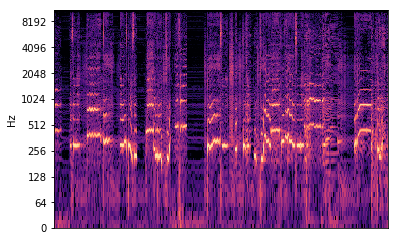

epoch 15/100, loss 0.0170994084328413
epoch 15/100, loss 0.019122255966067314
epoch 15/100, loss 0.01592148281633854
epoch 15/100, loss 0.0209345743060112
epoch 15/100, loss 0.01740558259189129
epoch 15/100, loss 0.010889626108109951
epoch 15/100, loss 0.013732711784541607
epoch 15/100, loss 0.016070442274212837
epoch 15/100, loss 0.013719738461077213
epoch 15/100, loss 0.01439880020916462
epoch 15/100, loss 0.014793612994253635
epoch 15/100, loss 0.009642274118959904
epoch 15/100, loss 0.014203093014657497
epoch 15/100, loss 0.02481241337954998
epoch 15/100, loss 0.010453542694449425
epoch 15/100, loss 0.01141005102545023
epoch 15/100, loss 0.013704213313758373
epoch 15/100, loss 0.008881427347660065
epoch 15/100, loss 0.012374392710626125
epoch 15/100, loss 0.01566663198173046
epoch 15/100, loss 0.01589312218129635
epoch 15/100, loss 0.017385035753250122
epoch 15/100, loss 0.014386413618922234
epoch 15/100, loss 0.008985416032373905
epoch 15/100, loss 0.011109663173556328
epoch 15/10

epoch 15/100, loss 0.012133169919252396
epoch 15/100, loss 0.014169076457619667
epoch 15/100, loss 0.014170010574162006
epoch 15/100, loss 0.013536474667489529
epoch 15/100, loss 0.016918055713176727
epoch 15/100, loss 0.011438600718975067
epoch 15/100, loss 0.009577837772667408
epoch 15/100, loss 0.01619880646467209
epoch 15/100, loss 0.015545488335192204
epoch 15/100, loss 0.019006168469786644
epoch 15/100, loss 0.019748281687498093
epoch 15/100, loss 0.014410673640668392
epoch 15/100, loss 0.012354456819593906
epoch 15/100, loss 0.013041605241596699
epoch 15/100, loss 0.01571182906627655
epoch 15/100, loss 0.013942882418632507
epoch 15/100, loss 0.014916240237653255
epoch 15/100, loss 0.016679275780916214
epoch 15/100, loss 0.020985787734389305
epoch 15/100, loss 0.015148527920246124
epoch 15/100, loss 0.014713281765580177
epoch 15/100, loss 0.009302445687353611
epoch 15/100, loss 0.009697775356471539
epoch 15/100, loss 0.01645074598491192
epoch 15/100, loss 0.013002832420170307
epo

epoch 15/100, loss 0.02554166503250599
epoch 15/100, loss 0.036265093833208084
epoch 15/100, loss 0.020566817373037338
epoch 15/100, loss 0.019704075530171394
epoch 15/100, loss 0.02541149966418743
epoch 15/100, loss 0.037614285945892334
epoch 15/100, loss 0.03032754734158516
epoch 15/100, loss 0.019076956436038017
epoch 15/100, loss 0.012838510796427727
epoch 15/100, loss 0.022820234298706055
epoch 15/100, loss 0.026212507858872414
epoch 15/100, loss 0.019825031980872154
epoch 15/100, loss 0.017142467200756073
epoch 15/100, loss 0.015727421268820763
epoch 15/100, loss 0.018477952107787132
epoch 15/100, loss 0.017448842525482178
epoch 15/100, loss 0.012318822555243969
epoch 15/100, loss 0.030125822871923447
epoch 15/100, loss 0.03470258787274361
epoch 15/100, loss 0.04515695944428444
epoch 15/100, loss 0.03568644821643829
epoch 15/100, loss 0.0204611923545599
epoch 15/100, loss 0.03103816695511341
epoch 15/100, loss 0.013218071311712265
epoch 15/100, loss 0.023617800325155258
epoch 15/

epoch 15/100, loss 0.03448312357068062
epoch 15/100, loss 0.0105260219424963
epoch 15/100, loss 0.013529960997402668
epoch 15/100, loss 0.015329542569816113
epoch 15/100, loss 0.010101470164954662
epoch 15/100, loss 0.03154199942946434
epoch 15/100, loss 0.01491320226341486
epoch 15/100, loss 0.01553757768124342
epoch 15/100, loss 0.017887499183416367
epoch 15/100, loss 0.01445774920284748
epoch 15/100, loss 0.015628932043910027
epoch 15/100, loss 0.015974536538124084
epoch 15/100, loss 0.01122596301138401
epoch 15/100, loss 0.016363682225346565
epoch 15/100, loss 0.014230787754058838
epoch 15/100, loss 0.01661115512251854
epoch 15/100, loss 0.012057902291417122
epoch 15/100, loss 0.02128780074417591
epoch 15/100, loss 0.016833100467920303
epoch 15/100, loss 0.03209585323929787
epoch 15/100, loss 0.018528440967202187
epoch 15/100, loss 0.04017378389835358
epoch 15/100, loss 0.013388346880674362
epoch 15/100, loss 0.02870998904109001
epoch 15/100, loss 0.00989949144423008
epoch 15/100, 

epoch 15/100, loss 0.012012881226837635
epoch 15/100, loss 0.020747805014252663
epoch 15/100, loss 0.01402301900088787
epoch 15/100, loss 0.010306383483111858
epoch 15/100, loss 0.01499896589666605
epoch 15/100, loss 0.014889162965118885
epoch 15/100, loss 0.027793610468506813
epoch 15/100, loss 0.012233740650117397
epoch 15/100, loss 0.011919371783733368
epoch 15/100, loss 0.010274986736476421
epoch 15/100, loss 0.014386956579983234
epoch 15/100, loss 0.012541673146188259
epoch 15/100, loss 0.015620351769030094
epoch 15/100, loss 0.01837988570332527
epoch 15/100, loss 0.01419434230774641
epoch 15/100, loss 0.01727917045354843
epoch 15/100, loss 0.013423516415059566
epoch 15/100, loss 0.01401954609900713
epoch 15/100, loss 0.007460455875843763
epoch 15/100, loss 0.01928321272134781
epoch 15/100, loss 0.015636321157217026
epoch 15/100, loss 0.016289006918668747
epoch 15/100, loss 0.017241597175598145
epoch 15/100, loss 0.009343747980892658
epoch 15/100, loss 0.011192592792212963
epoch 1

epoch 15/100, loss 0.0120918620377779
epoch 15/100, loss 0.016117312014102936
epoch 15/100, loss 0.010810840874910355
epoch 15/100, loss 0.014667917974293232
epoch 15/100, loss 0.015500597655773163
epoch 15/100, loss 0.015318736433982849
epoch 15/100, loss 0.009922798722982407
epoch 15/100, loss 0.015179489739239216
epoch 15/100, loss 0.009548808448016644
epoch 15/100, loss 0.026579678058624268
epoch 15/100, loss 0.01100221835076809
epoch 15/100, loss 0.018176769837737083
epoch 15/100, loss 0.01262153871357441
epoch 15/100, loss 0.018255963921546936
epoch 15/100, loss 0.014067032374441624
epoch 15/100, loss 0.013430431485176086
epoch 15/100, loss 0.008185023441910744
epoch 15/100, loss 0.014462468214333057
epoch 15/100, loss 0.010474727489054203
epoch 15/100, loss 0.012069935910403728
epoch 15/100, loss 0.010628210380673409
epoch 15/100, loss 0.011281839571893215
epoch 15/100, loss 0.01042450312525034
epoch 15/100, loss 0.013465075753629208
epoch 15/100, loss 0.014996417798101902
epoch

epoch 15/100, loss 0.01719476282596588
epoch 15/100, loss 0.011761020869016647
epoch 15/100, loss 0.01341913640499115
epoch 15/100, loss 0.010622727684676647
epoch 15/100, loss 0.02186616323888302
epoch 15/100, loss 0.01387618575245142
epoch 15/100, loss 0.008356696926057339
epoch 15/100, loss 0.013300090096890926
epoch 15/100, loss 0.009864280931651592
epoch 15/100, loss 0.010697816498577595
epoch 15/100, loss 0.01875973679125309
epoch 15/100, loss 0.012598787434399128
epoch 15/100, loss 0.01098534557968378
epoch 15/100, loss 0.012129374779760838
epoch 15/100, loss 0.01421393733471632
epoch 15/100, loss 0.022010548040270805
epoch 15/100, loss 0.01679719053208828
epoch 15/100, loss 0.013141551986336708
epoch 15/100, loss 0.011716816574335098
epoch 15/100, loss 0.013112369924783707
epoch 15/100, loss 0.011851474642753601
epoch 15/100, loss 0.013418817892670631
epoch 15/100, loss 0.008816276676952839
epoch 15/100, loss 0.00982494093477726
epoch 15/100, loss 0.013158767484128475
epoch 15/

epoch 16/100, loss 0.01074168924242258
epoch 16/100, loss 0.013651808723807335
epoch 16/100, loss 0.015337559394538403
epoch 16/100, loss 0.009488044306635857
epoch 16/100, loss 0.012831749394536018
epoch 16/100, loss 0.020327892154455185
epoch 16/100, loss 0.011994127184152603
epoch 16/100, loss 0.015496820211410522
epoch 16/100, loss 0.01055147498846054
epoch 16/100, loss 0.020655881613492966
epoch 16/100, loss 0.02013741433620453
epoch 16/100, loss 0.013283132575452328
epoch 16/100, loss 0.01729467511177063
epoch 16/100, loss 0.008470509201288223
epoch 16/100, loss 0.011919585056602955
epoch 16/100, loss 0.014977086335420609
epoch 16/100, loss 0.01539468765258789
epoch 16/100, loss 0.01767522655427456
epoch 16/100, loss 0.015298719517886639
epoch 16/100, loss 0.015795329585671425
epoch 16/100, loss 0.009471004828810692
epoch 16/100, loss 0.012814068235456944
epoch 16/100, loss 0.00853875931352377
epoch 16/100, loss 0.01219269074499607
epoch 16/100, loss 0.01149413175880909
epoch 16/

epoch 16/100, loss 0.01294691301882267
epoch 16/100, loss 0.019072508439421654
epoch 16/100, loss 0.014515107497572899
epoch 16/100, loss 0.012072204612195492
epoch 16/100, loss 0.011438116431236267
epoch 16/100, loss 0.027213890105485916
epoch 16/100, loss 0.007798647973686457
epoch 16/100, loss 0.010316380299627781
epoch 16/100, loss 0.022425616160035133
epoch 16/100, loss 0.016528967767953873
epoch 16/100, loss 0.01344460528343916
epoch 16/100, loss 0.01620342954993248
epoch 16/100, loss 0.015773870050907135
epoch 16/100, loss 0.009287354536354542
epoch 16/100, loss 0.01630406267940998
epoch 16/100, loss 0.009134164080023766
epoch 16/100, loss 0.017552003264427185
epoch 16/100, loss 0.022812459617853165
epoch 16/100, loss 0.008668096736073494
epoch 16/100, loss 0.014399305917322636
epoch 16/100, loss 0.01066829077899456
epoch 16/100, loss 0.012246398255228996
epoch 16/100, loss 0.016195882111787796
epoch 16/100, loss 0.017706159502267838
epoch 16/100, loss 0.01886799745261669
epoch 

epoch 16/100, loss 0.00977021548897028
epoch 16/100, loss 0.012541611678898335
epoch 16/100, loss 0.009533090516924858
epoch 16/100, loss 0.01831287331879139
epoch 16/100, loss 0.01602150872349739
epoch 16/100, loss 0.011204513721168041
epoch 16/100, loss 0.011601194739341736
epoch 16/100, loss 0.013664454221725464
epoch 16/100, loss 0.011776837520301342
epoch 16/100, loss 0.011719097383320332
epoch 16/100, loss 0.012252298183739185
epoch 16/100, loss 0.014380553737282753
epoch 16/100, loss 0.017147840932011604
epoch 16/100, loss 0.012695553712546825
epoch 16/100, loss 0.0152535829693079
epoch 16/100, loss 0.015752166509628296
epoch 16/100, loss 0.015344494953751564
epoch 16/100, loss 0.009835795499384403
epoch 16/100, loss 0.013405298814177513
epoch 16/100, loss 0.021467220038175583
epoch 16/100, loss 0.018313543871045113
epoch 16/100, loss 0.011918713338673115
epoch 16/100, loss 0.013070033863186836
epoch 16/100, loss 0.008114820346236229
epoch 16/100, loss 0.010243390686810017
epoch

epoch 16/100, loss 0.01378326304256916
epoch 16/100, loss 0.02117680013179779
epoch 16/100, loss 0.010619058273732662
epoch 16/100, loss 0.01500473078340292
epoch 16/100, loss 0.014842290431261063
epoch 16/100, loss 0.012162309139966965
epoch 16/100, loss 0.027219288051128387
epoch 16/100, loss 0.008687427267432213
epoch 16/100, loss 0.013797882944345474
epoch 16/100, loss 0.019907252863049507
epoch 16/100, loss 0.013276884332299232
epoch 16/100, loss 0.019523965194821358
epoch 16/100, loss 0.01879604160785675
epoch 16/100, loss 0.015435389243066311
epoch 16/100, loss 0.017258543521165848
epoch 16/100, loss 0.010077390819787979
epoch 16/100, loss 0.01486463937908411
epoch 16/100, loss 0.016651246696710587
epoch 16/100, loss 0.010529107414186
epoch 16/100, loss 0.014449519105255604
epoch 16/100, loss 0.016806628555059433
epoch 16/100, loss 0.012947735376656055
epoch 16/100, loss 0.010677882470190525
epoch 16/100, loss 0.015781760215759277
epoch 16/100, loss 0.013337971642613411
epoch 16

epoch 16/100, loss 0.011629274114966393
epoch 16/100, loss 0.008289048448204994
epoch 16/100, loss 0.012271019630134106
epoch 16/100, loss 0.0076080565340816975
epoch 16/100, loss 0.015210853889584541
epoch 16/100, loss 0.014888840727508068
epoch 16/100, loss 0.014825263991951942
epoch 16/100, loss 0.010302355512976646
epoch 16/100, loss 0.012663817033171654
epoch 16/100, loss 0.013713528402149677
epoch 16/100, loss 0.02358580194413662
epoch 16/100, loss 0.006845466792583466
epoch 16/100, loss 0.015270390547811985
epoch 16/100, loss 0.016331536695361137
epoch 16/100, loss 0.01202397234737873
epoch 16/100, loss 0.014827647246420383
epoch 16/100, loss 0.014454609714448452
epoch 16/100, loss 0.014212214387953281
epoch 16/100, loss 0.01426074281334877
epoch 16/100, loss 0.016443200409412384
epoch 16/100, loss 0.013290145434439182
epoch 16/100, loss 0.023197676986455917
epoch 16/100, loss 0.02550501748919487
epoch 16/100, loss 0.013222511857748032
epoch 16/100, loss 0.012871749699115753
epo

epoch 16/100, loss 0.012043905444443226
epoch 16/100, loss 0.016679959371685982
epoch 16/100, loss 0.01349407434463501
epoch 16/100, loss 0.014711998403072357
epoch 16/100, loss 0.014553947374224663
epoch 16/100, loss 0.012944666668772697
epoch 16/100, loss 0.019880061969161034
epoch 16/100, loss 0.01573767513036728
epoch 16/100, loss 0.019007688388228416
epoch 16/100, loss 0.01515029277652502
epoch 16/100, loss 0.010708523914217949
epoch 16/100, loss 0.01238382700830698
epoch 16/100, loss 0.015696115791797638
epoch 16/100, loss 0.014676231890916824
epoch 16/100, loss 0.01209329441189766
epoch 16/100, loss 0.008757565170526505
epoch 16/100, loss 0.01586315780878067
epoch 16/100, loss 0.01599278673529625
epoch 16/100, loss 0.009104935452342033
epoch 16/100, loss 0.016643354669213295
epoch 16/100, loss 0.015957411378622055
epoch 16/100, loss 0.010637142695486546
epoch 16/100, loss 0.014140459708869457
epoch 16/100, loss 0.014215663075447083
epoch 16/100, loss 0.011241867206990719
epoch 1

epoch 16/100, loss 0.015325949527323246
epoch 16/100, loss 0.013833066448569298
epoch 16/100, loss 0.017009852454066277
epoch 16/100, loss 0.01155557669699192
epoch 16/100, loss 0.01732039637863636
epoch 16/100, loss 0.021839095279574394
epoch 16/100, loss 0.01676134765148163
epoch 16/100, loss 0.01820097118616104
epoch 16/100, loss 0.009811433032155037
epoch 16/100, loss 0.01270146481692791
epoch 16/100, loss 0.016973178833723068
epoch 16/100, loss 0.013475656509399414
epoch 16/100, loss 0.01982916332781315
epoch 16/100, loss 0.01718154549598694
epoch 16/100, loss 0.013262838125228882
epoch 16/100, loss 0.009759960696101189
epoch 16/100, loss 0.016939738765358925
epoch 16/100, loss 0.015165106393396854
epoch 16/100, loss 0.01709979958832264
epoch 16/100, loss 0.017949486151337624
epoch 16/100, loss 0.0182731244713068
epoch 16/100, loss 0.012105565518140793
epoch 16/100, loss 0.011770572513341904
epoch 16/100, loss 0.016642682254314423
epoch 16/100, loss 0.010571079328656197
epoch 16/1

epoch 17/100, loss 0.009352223947644234
epoch 17/100, loss 0.012320694513618946
epoch 17/100, loss 0.019700204953551292
epoch 17/100, loss 0.008240839466452599
epoch 17/100, loss 0.011961372569203377
epoch 17/100, loss 0.013110890053212643
epoch 17/100, loss 0.012467440217733383
epoch 17/100, loss 0.022722633555531502
epoch 17/100, loss 0.02120412327349186
epoch 17/100, loss 0.01079966314136982
epoch 17/100, loss 0.011939235031604767
epoch 17/100, loss 0.013408766128122807
epoch 17/100, loss 0.008288848213851452
epoch 17/100, loss 0.014231577515602112
epoch 17/100, loss 0.010394369252026081
epoch 17/100, loss 0.013526435941457748
epoch 17/100, loss 0.014707120135426521
epoch 17/100, loss 0.015996912494301796
epoch 17/100, loss 0.010309590958058834
epoch 17/100, loss 0.012090454809367657
epoch 17/100, loss 0.013966348953545094
epoch 17/100, loss 0.017393987625837326
epoch 17/100, loss 0.017317166551947594
epoch 17/100, loss 0.020365774631500244
epoch 17/100, loss 0.012593431398272514
ep

epoch 17/100, loss 0.012056391686201096
epoch 17/100, loss 0.012313778512179852
epoch 17/100, loss 0.015161894261837006
epoch 17/100, loss 0.012713918462395668
epoch 17/100, loss 0.010881638154387474
epoch 17/100, loss 0.013969355262815952
epoch 17/100, loss 0.011441933922469616
epoch 17/100, loss 0.013212506659328938
epoch 17/100, loss 0.008528816513717175
epoch 17/100, loss 0.02123505435883999
epoch 17/100, loss 0.01303228922188282
epoch 17/100, loss 0.015449542552232742
epoch 17/100, loss 0.010634956881403923
epoch 17/100, loss 0.015793150290846825
epoch 17/100, loss 0.014265709556639194
epoch 17/100, loss 0.012133459560573101
epoch 17/100, loss 0.016820216551423073
epoch 17/100, loss 0.013081701472401619
epoch 17/100, loss 0.014911187812685966
epoch 17/100, loss 0.014386393129825592
epoch 17/100, loss 0.01667327806353569
epoch 17/100, loss 0.01067505031824112
epoch 17/100, loss 0.012933215126395226
epoch 17/100, loss 0.008433489128947258
epoch 17/100, loss 0.009472369216382504
epoc

epoch 17/100, loss 0.013704926706850529
epoch 17/100, loss 0.010104978457093239
epoch 17/100, loss 0.01572067104279995
epoch 17/100, loss 0.014677275903522968
epoch 17/100, loss 0.010337595827877522
epoch 17/100, loss 0.012049469165503979
epoch 17/100, loss 0.014594126492738724
epoch 17/100, loss 0.015469118021428585
epoch 17/100, loss 0.012386742047965527
epoch 17/100, loss 0.01581648737192154
epoch 17/100, loss 0.014193994924426079
epoch 17/100, loss 0.009135955944657326
epoch 17/100, loss 0.00852419063448906
epoch 17/100, loss 0.010221973992884159
epoch 17/100, loss 0.011996934190392494
epoch 17/100, loss 0.013478103093802929
epoch 17/100, loss 0.018227502703666687
epoch 17/100, loss 0.01076455321162939
epoch 17/100, loss 0.01369784027338028
epoch 17/100, loss 0.02041877619922161
epoch 17/100, loss 0.016158396378159523
epoch 17/100, loss 0.01652628742158413
epoch 17/100, loss 0.015927525237202644
epoch 17/100, loss 0.014045679941773415
epoch 17/100, loss 0.0139269158244133
epoch 17/

epoch 17/100, loss 0.011814048513770103
epoch 17/100, loss 0.014464846812188625
epoch 17/100, loss 0.012492971494793892
epoch 17/100, loss 0.006567604839801788
epoch 17/100, loss 0.014430435374379158
epoch 17/100, loss 0.016580188646912575
epoch 17/100, loss 0.01600809581577778
epoch 17/100, loss 0.01645956188440323
epoch 17/100, loss 0.0155987199395895
epoch 17/100, loss 0.010314421728253365
epoch 17/100, loss 0.017097031697630882
epoch 17/100, loss 0.013580878265202045
epoch 17/100, loss 0.00883879978209734
epoch 17/100, loss 0.014730031602084637
epoch 17/100, loss 0.010805032216012478
epoch 17/100, loss 0.009458090178668499
epoch 17/100, loss 0.017991453409194946
epoch 17/100, loss 0.011197276413440704
epoch 17/100, loss 0.014135431498289108
epoch 17/100, loss 0.009221218526363373
epoch 17/100, loss 0.01688818447291851
epoch 17/100, loss 0.013386806473135948
epoch 17/100, loss 0.019869916141033173
epoch 17/100, loss 0.00574515899643302
epoch 17/100, loss 0.019593391567468643
epoch 1

epoch 17/100, loss 0.013892486691474915
epoch 17/100, loss 0.011399488896131516
epoch 17/100, loss 0.01687811128795147
epoch 17/100, loss 0.011452003382146358
epoch 17/100, loss 0.01013302430510521
epoch 17/100, loss 0.015610111877322197
epoch 17/100, loss 0.012715091928839684
epoch 17/100, loss 0.015238546766340733
epoch 17/100, loss 0.014702367596328259
epoch 17/100, loss 0.013522874563932419
epoch 17/100, loss 0.013108950108289719
epoch 17/100, loss 0.012501525692641735
epoch 17/100, loss 0.011178188025951385
epoch 17/100, loss 0.010103893466293812
epoch 17/100, loss 0.014310025610029697
epoch 17/100, loss 0.01518823578953743
epoch 17/100, loss 0.01092310156673193
epoch 17/100, loss 0.010193673893809319
epoch 17/100, loss 0.008921436034142971
epoch 17/100, loss 0.012220095843076706
epoch 17/100, loss 0.015574031509459019
epoch 17/100, loss 0.013500153087079525
epoch 17/100, loss 0.010072790086269379
epoch 17/100, loss 0.012716367840766907
epoch 17/100, loss 0.013587306253612041
epoc

epoch 17/100, loss 0.016437189653515816
epoch 17/100, loss 0.007784138899296522
epoch 17/100, loss 0.014118531718850136
epoch 17/100, loss 0.010175341740250587
epoch 17/100, loss 0.025297686457633972
epoch 17/100, loss 0.01163919735699892
epoch 17/100, loss 0.013376185670495033
epoch 17/100, loss 0.013034041039645672
epoch 17/100, loss 0.01258182991296053
epoch 17/100, loss 0.02216746285557747
epoch 17/100, loss 0.012674695812165737
epoch 17/100, loss 0.0182341355830431
epoch 17/100, loss 0.015366018749773502
epoch 17/100, loss 0.011423592455685139
epoch 17/100, loss 0.007270719390362501
epoch 17/100, loss 0.0118674635887146
epoch 17/100, loss 0.012024989351630211
epoch 17/100, loss 0.009111392311751842
epoch 17/100, loss 0.01307617872953415
epoch 17/100, loss 0.01536176074296236
epoch 17/100, loss 0.01432755496352911
epoch 17/100, loss 0.0200995821505785
epoch 17/100, loss 0.018825870007276535
epoch 17/100, loss 0.02138519287109375
epoch 17/100, loss 0.008918759413063526
epoch 17/100,

epoch 17/100, loss 0.013776620849967003
epoch 17/100, loss 0.020292071625590324
epoch 17/100, loss 0.014675367623567581
epoch 17/100, loss 0.011733770370483398
epoch 17/100, loss 0.011468716897070408
epoch 17/100, loss 0.011962012387812138
epoch 17/100, loss 0.0133081478998065
epoch 17/100, loss 0.007464139722287655
epoch 17/100, loss 0.009377817623317242
epoch 18/100, loss 0.011566881090402603
epoch 18/100, loss 0.019632332026958466
epoch 18/100, loss 0.01594993658363819
epoch 18/100, loss 0.01606011390686035
epoch 18/100, loss 0.017509492114186287
epoch 18/100, loss 0.012057891115546227
epoch 18/100, loss 0.009407096542418003
epoch 18/100, loss 0.014255332760512829
epoch 18/100, loss 0.01625508815050125
epoch 18/100, loss 0.01550770178437233
epoch 18/100, loss 0.016923993825912476
epoch 18/100, loss 0.01340961642563343
epoch 18/100, loss 0.015782933682203293
epoch 18/100, loss 0.02196172997355461
epoch 18/100, loss 0.014244808815419674
epoch 18/100, loss 0.014397392980754375
epoch 18

epoch 18/100, loss 0.010852827690541744
epoch 18/100, loss 0.011884761974215508
epoch 18/100, loss 0.015073700807988644
epoch 18/100, loss 0.011206530034542084
epoch 18/100, loss 0.008996721357107162
epoch 18/100, loss 0.015426489524543285
epoch 18/100, loss 0.017435623332858086
epoch 18/100, loss 0.0199605580419302
epoch 18/100, loss 0.013900773599743843
epoch 18/100, loss 0.010898711159825325
epoch 18/100, loss 0.017604108899831772
epoch 18/100, loss 0.01425106916576624
epoch 18/100, loss 0.005749526433646679
epoch 18/100, loss 0.009159542620182037
epoch 18/100, loss 0.01723989099264145
epoch 18/100, loss 0.013530968688428402
epoch 18/100, loss 0.011941405013203621
epoch 18/100, loss 0.013940764591097832
epoch 18/100, loss 0.009051847271621227
epoch 18/100, loss 0.011756748892366886
epoch 18/100, loss 0.009397518821060658
epoch 18/100, loss 0.009569382295012474
epoch 18/100, loss 0.012610528618097305
epoch 18/100, loss 0.014364155940711498
epoch 18/100, loss 0.010525444522500038
epoc

epoch 18/100, loss 0.013914995826780796
epoch 18/100, loss 0.014154314063489437
epoch 18/100, loss 0.012331176549196243
epoch 18/100, loss 0.014573667198419571
epoch 18/100, loss 0.013683740980923176
epoch 18/100, loss 0.012948116287589073
epoch 18/100, loss 0.013669317588210106
epoch 18/100, loss 0.018250834196805954
epoch 18/100, loss 0.019505798816680908
epoch 18/100, loss 0.014115906320512295
epoch 18/100, loss 0.013842825777828693
epoch 18/100, loss 0.015652993693947792
epoch 18/100, loss 0.01780611462891102
epoch 18/100, loss 0.018243003636598587
epoch 18/100, loss 0.012060380540788174
epoch 18/100, loss 0.014361211098730564
epoch 18/100, loss 0.01664011739194393
epoch 18/100, loss 0.017070988193154335
epoch 18/100, loss 0.012420120649039745
epoch 18/100, loss 0.013123338110744953
epoch 18/100, loss 0.014678915031254292
epoch 18/100, loss 0.012157329358160496
epoch 18/100, loss 0.016090763732790947
epoch 18/100, loss 0.012687599286437035
epoch 18/100, loss 0.010952506214380264
ep

epoch 18/100, loss 0.011027772910892963
epoch 18/100, loss 0.015095673501491547
epoch 18/100, loss 0.02306588739156723
epoch 18/100, loss 0.011107723228633404
epoch 18/100, loss 0.014836492016911507
epoch 18/100, loss 0.009998321533203125
epoch 18/100, loss 0.01425702404230833
epoch 18/100, loss 0.017180006951093674
epoch 18/100, loss 0.011451933532953262
epoch 18/100, loss 0.014826926402747631
epoch 18/100, loss 0.012667668983340263
epoch 18/100, loss 0.01102827861905098
epoch 18/100, loss 0.013713099993765354
epoch 18/100, loss 0.0116096967831254
epoch 18/100, loss 0.009006129577755928
epoch 18/100, loss 0.013316032476723194
epoch 18/100, loss 0.012140405364334583
epoch 18/100, loss 0.012581845745444298
epoch 18/100, loss 0.011495767161250114
epoch 18/100, loss 0.011898093856871128
epoch 18/100, loss 0.011577491648495197
epoch 18/100, loss 0.0120204146951437
epoch 18/100, loss 0.017243171110749245
epoch 18/100, loss 0.011286800727248192
epoch 18/100, loss 0.008620006963610649
epoch 1

epoch 18/100, loss 0.015005080960690975
epoch 18/100, loss 0.01528856996446848
epoch 18/100, loss 0.013245531357824802
epoch 18/100, loss 0.011848172172904015
epoch 18/100, loss 0.013517812825739384
epoch 18/100, loss 0.01367267407476902
epoch 18/100, loss 0.008868740871548653
epoch 18/100, loss 0.015731975436210632
epoch 18/100, loss 0.01285756379365921
epoch 18/100, loss 0.01719745062291622
epoch 18/100, loss 0.012512968853116035
epoch 18/100, loss 0.012424709275364876
epoch 18/100, loss 0.024234674870967865
epoch 18/100, loss 0.012731875292956829
epoch 18/100, loss 0.01523986179381609
epoch 18/100, loss 0.010197087191045284
epoch 18/100, loss 0.017275370657444
epoch 18/100, loss 0.00848324690014124
epoch 18/100, loss 0.012681091204285622
epoch 18/100, loss 0.02221786417067051
epoch 18/100, loss 0.011043732985854149
epoch 18/100, loss 0.011624544858932495
epoch 18/100, loss 0.020312070846557617
epoch 18/100, loss 0.013638018630445004
epoch 18/100, loss 0.016673510894179344
epoch 18/1

epoch 18/100, loss 0.016665896400809288
epoch 18/100, loss 0.011019703932106495
epoch 18/100, loss 0.013801217079162598
epoch 18/100, loss 0.0154954195022583
epoch 18/100, loss 0.011991946026682854
epoch 18/100, loss 0.016963759437203407
epoch 18/100, loss 0.014108192175626755
epoch 18/100, loss 0.01056768000125885
epoch 18/100, loss 0.011135106906294823
epoch 18/100, loss 0.0072652800008654594
epoch 18/100, loss 0.009904357604682446
epoch 18/100, loss 0.017049184069037437
epoch 18/100, loss 0.01123717613518238
epoch 18/100, loss 0.01689755730330944
epoch 18/100, loss 0.015696467831730843
epoch 18/100, loss 0.01363619789481163
epoch 18/100, loss 0.014910551719367504
epoch 18/100, loss 0.011585838161408901
epoch 18/100, loss 0.014421151950955391
epoch 18/100, loss 0.01063072495162487
epoch 18/100, loss 0.02352268248796463
epoch 18/100, loss 0.013118093833327293
epoch 18/100, loss 0.013241294771432877
epoch 18/100, loss 0.01328775379806757
epoch 18/100, loss 0.01624688319861889
epoch 18/

epoch 18/100, loss 0.009533660486340523
epoch 18/100, loss 0.013059836812317371
epoch 18/100, loss 0.012075308710336685
epoch 18/100, loss 0.011594572104513645
epoch 18/100, loss 0.01310114935040474
epoch 18/100, loss 0.013893681578338146
epoch 18/100, loss 0.017211003229022026
epoch 18/100, loss 0.01804526150226593
epoch 18/100, loss 0.01756378263235092
epoch 18/100, loss 0.013269764371216297
epoch 18/100, loss 0.0109420046210289
epoch 18/100, loss 0.012086928822100163
epoch 18/100, loss 0.016292467713356018
epoch 18/100, loss 0.015336519107222557
epoch 18/100, loss 0.009652353823184967
epoch 18/100, loss 0.0195454228669405
epoch 18/100, loss 0.018412312492728233
epoch 18/100, loss 0.013523350469768047
epoch 18/100, loss 0.0174925085157156
epoch 18/100, loss 0.010532722808420658
epoch 18/100, loss 0.01555720716714859
epoch 18/100, loss 0.009301917627453804
epoch 18/100, loss 0.01382592786103487
epoch 18/100, loss 0.026227224618196487
epoch 18/100, loss 0.01256400067359209
epoch 18/100

epoch 19/100, loss 0.015979276970028877
epoch 19/100, loss 0.011663283221423626
epoch 19/100, loss 0.010939783416688442
epoch 19/100, loss 0.012522198259830475
epoch 19/100, loss 0.018170999363064766
epoch 19/100, loss 0.014158083125948906
epoch 19/100, loss 0.009406459517776966
epoch 19/100, loss 0.01038575079292059
epoch 19/100, loss 0.011671701446175575
epoch 19/100, loss 0.02035689540207386
epoch 19/100, loss 0.01368296705186367
epoch 19/100, loss 0.012084637768566608
epoch 19/100, loss 0.011267309077084064
epoch 19/100, loss 0.017535991966724396
epoch 19/100, loss 0.01550235040485859
epoch 19/100, loss 0.013252193108201027
epoch 19/100, loss 0.022113025188446045
epoch 19/100, loss 0.015736466273665428
epoch 19/100, loss 0.012916607782244682
epoch 19/100, loss 0.016131799668073654
epoch 19/100, loss 0.015746712684631348
epoch 19/100, loss 0.015353577211499214
epoch 19/100, loss 0.013338265009224415
epoch 19/100, loss 0.015149818733334541
epoch 19/100, loss 0.014082327485084534
epoc

epoch 19/100, loss 0.015307039953768253
epoch 19/100, loss 0.012289193458855152
epoch 19/100, loss 0.013237575069069862
epoch 19/100, loss 0.014156175777316093
epoch 19/100, loss 0.011357818730175495
epoch 19/100, loss 0.010810691863298416
epoch 19/100, loss 0.019165771082043648
epoch 19/100, loss 0.01639675907790661
epoch 19/100, loss 0.01234420482069254
epoch 19/100, loss 0.015151049941778183
epoch 19/100, loss 0.015957487747073174
epoch 19/100, loss 0.01107803639024496
epoch 19/100, loss 0.014715124852955341
epoch 19/100, loss 0.009323243983089924
epoch 19/100, loss 0.011070453561842442
epoch 19/100, loss 0.01387066300958395
epoch 19/100, loss 0.01070581004023552
epoch 19/100, loss 0.012254428118467331
epoch 19/100, loss 0.0173235721886158
epoch 19/100, loss 0.013715100474655628
epoch 19/100, loss 0.012888223864138126
epoch 19/100, loss 0.014092977158725262
epoch 19/100, loss 0.015010137110948563
epoch 19/100, loss 0.011262131854891777
epoch 19/100, loss 0.013825937174260616
epoch 1

epoch 19/100, loss 0.014540360309183598
epoch 19/100, loss 0.0154365673661232
epoch 19/100, loss 0.014605581760406494
epoch 19/100, loss 0.00993417203426361
epoch 19/100, loss 0.02199706621468067
epoch 19/100, loss 0.014734729193150997
epoch 19/100, loss 0.01134128775447607
epoch 19/100, loss 0.0068782116286456585
epoch 19/100, loss 0.014589236117899418
epoch 19/100, loss 0.011937230825424194
epoch 19/100, loss 0.016530411317944527
epoch 19/100, loss 0.011256979778409004
epoch 19/100, loss 0.021791808307170868
epoch 19/100, loss 0.012482265941798687
epoch 19/100, loss 0.016626007854938507
epoch 19/100, loss 0.012883879244327545
epoch 19/100, loss 0.01173952966928482
epoch 19/100, loss 0.015209461562335491
epoch 19/100, loss 0.017764883115887642
epoch 19/100, loss 0.018760835751891136
epoch 19/100, loss 0.009588927961885929
epoch 19/100, loss 0.019250962883234024
epoch 19/100, loss 0.010448473505675793
epoch 19/100, loss 0.02055283822119236
epoch 19/100, loss 0.010061238892376423
epoch 

epoch 19/100, loss 0.016921991482377052
epoch 19/100, loss 0.009002763777971268
epoch 19/100, loss 0.018182015046477318
epoch 19/100, loss 0.015106969512999058
epoch 19/100, loss 0.016682980582118034
epoch 19/100, loss 0.011981610208749771
epoch 19/100, loss 0.020734669640660286
epoch 19/100, loss 0.016277825459837914
epoch 19/100, loss 0.019793475046753883
epoch 19/100, loss 0.01011210773140192
epoch 19/100, loss 0.01589626632630825
epoch 19/100, loss 0.01207032147794962
epoch 19/100, loss 0.012021075002849102
epoch 19/100, loss 0.016280757263302803
epoch 19/100, loss 0.015805918723344803
epoch 19/100, loss 0.012343852780759335
epoch 19/100, loss 0.007508387789130211
epoch 19/100, loss 0.01239834912121296
epoch 19/100, loss 0.01709948666393757
epoch 19/100, loss 0.015104037709534168
epoch 19/100, loss 0.011983034200966358
epoch 19/100, loss 0.011617610231041908
epoch 19/100, loss 0.013888821937143803
epoch 19/100, loss 0.012133989483118057
epoch 19/100, loss 0.010479516349732876
epoch

epoch 19/100, loss 0.013546973466873169
epoch 19/100, loss 0.011886829510331154
epoch 19/100, loss 0.012118914164602757
epoch 19/100, loss 0.009513773955404758
epoch 19/100, loss 0.012402907013893127
epoch 19/100, loss 0.013092703185975552
epoch 19/100, loss 0.023010633885860443
epoch 19/100, loss 0.010708363726735115
epoch 19/100, loss 0.013860400766134262
epoch 19/100, loss 0.016749653965234756
epoch 19/100, loss 0.017131516709923744
epoch 19/100, loss 0.012633255682885647
epoch 19/100, loss 0.0065616522915661335
epoch 19/100, loss 0.014576946385204792
epoch 19/100, loss 0.011884048581123352
epoch 19/100, loss 0.010179066099226475
epoch 19/100, loss 0.017634129151701927
epoch 19/100, loss 0.012167722918093204
epoch 19/100, loss 0.015803569927811623
epoch 19/100, loss 0.0107798520475626
epoch 19/100, loss 0.011607239954173565
epoch 19/100, loss 0.014006423763930798
epoch 19/100, loss 0.016490284353494644
epoch 19/100, loss 0.016449516639113426
epoch 19/100, loss 0.013004820793867111
e

epoch 19/100, loss 0.007004200015217066
epoch 19/100, loss 0.02019374445080757
epoch 19/100, loss 0.018588943406939507
epoch 19/100, loss 0.015664225444197655
epoch 19/100, loss 0.013634649105370045
epoch 19/100, loss 0.012079565785825253
epoch 19/100, loss 0.014416462741792202
epoch 19/100, loss 0.014730100519955158
epoch 19/100, loss 0.010937081649899483
epoch 19/100, loss 0.013966641388833523
epoch 19/100, loss 0.014223309233784676
epoch 19/100, loss 0.016855426132678986
epoch 19/100, loss 0.010785282589495182
epoch 19/100, loss 0.01227728184312582
epoch 19/100, loss 0.010065669193863869
epoch 19/100, loss 0.015274252742528915
epoch 19/100, loss 0.012523056007921696
epoch 19/100, loss 0.012263325974345207
epoch 19/100, loss 0.015911050140857697
epoch 19/100, loss 0.01201142743229866
epoch 19/100, loss 0.011491566896438599
epoch 19/100, loss 0.018801016733050346
epoch 19/100, loss 0.009958822280168533
epoch 19/100, loss 0.01020694337785244
epoch 19/100, loss 0.01194875966757536
epoch

epoch 19/100, loss 0.010723852552473545
epoch 19/100, loss 0.011722142808139324
epoch 19/100, loss 0.012264096178114414
epoch 19/100, loss 0.013912494294345379
epoch 19/100, loss 0.01607918180525303
epoch 19/100, loss 0.01752474717795849
epoch 19/100, loss 0.014834190718829632
epoch 19/100, loss 0.01696036010980606
epoch 19/100, loss 0.008808963000774384
epoch 19/100, loss 0.015483038499951363
epoch 19/100, loss 0.012127380818128586
epoch 19/100, loss 0.0123287970200181
epoch 19/100, loss 0.007969948463141918
epoch 19/100, loss 0.009650981053709984
epoch 19/100, loss 0.013512122444808483
epoch 19/100, loss 0.011657756753265858
epoch 19/100, loss 0.01575484313070774
epoch 19/100, loss 0.014701161533594131
epoch 19/100, loss 0.010860164649784565
epoch 19/100, loss 0.014841132797300816
epoch 19/100, loss 0.016605684533715248
epoch 19/100, loss 0.017281780019402504
epoch 19/100, loss 0.010091159492731094
epoch 19/100, loss 0.016735296696424484
epoch 19/100, loss 0.013841439038515091
epoch 

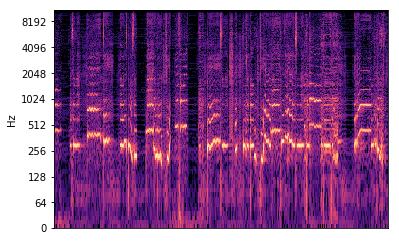

epoch 20/100, loss 0.015914427116513252
epoch 20/100, loss 0.011132459156215191
epoch 20/100, loss 0.012926284223794937
epoch 20/100, loss 0.020086564123630524
epoch 20/100, loss 0.007157431449741125
epoch 20/100, loss 0.011792623437941074
epoch 20/100, loss 0.014527386985719204
epoch 20/100, loss 0.020902754738926888
epoch 20/100, loss 0.015309207141399384
epoch 20/100, loss 0.016303932294249535
epoch 20/100, loss 0.013865389861166477
epoch 20/100, loss 0.012116510421037674
epoch 20/100, loss 0.011264242231845856
epoch 20/100, loss 0.01967626065015793
epoch 20/100, loss 0.01032032910734415
epoch 20/100, loss 0.013224324211478233
epoch 20/100, loss 0.0108747947961092
epoch 20/100, loss 0.014338484965264797
epoch 20/100, loss 0.013442358933389187
epoch 20/100, loss 0.013924633152782917
epoch 20/100, loss 0.01159182284027338
epoch 20/100, loss 0.013139833696186543
epoch 20/100, loss 0.02306542359292507
epoch 20/100, loss 0.012440048158168793
epoch 20/100, loss 0.01028189156204462
epoch 2

KeyboardInterrupt: 

In [22]:
indices = np.random.permutation(dataset.dataset_size)[:batch_size]
start_sequences = to_var(torch.from_numpy(dataset.x[indices]))

previous_epoch = -1

for x, y, epoch in dataset.get_next_batch(number_epochs):
  
  if previous_epoch != epoch and epoch % evaluate_every_epoch == 0:
    predicted_batch = run(encoder, decoder, start_sequences, 20)
    for i in range(1):
      predicted_audio = griffin_lim(predicted_batch[i].T, 
                                    n_iter=100, 
                                    window='hann', 
                                    n_fft=fft_size, 
                                    hop_length=hop_length)
      plot_audio(predicted_audio) 
    previous_epoch = epoch

  loss = train(encoder, 
               decoder, 
               encoder_optimiser,
               decoder_optimiser,
               x, 
               y,
               criterion, 
               clip_threshold)
  print("epoch {}/{}, loss {}".format(epoch, number_epochs, loss))


/home/eavi/leon/leon/lib/python3.5/site-packages/ipykernel_launcher.py:132: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


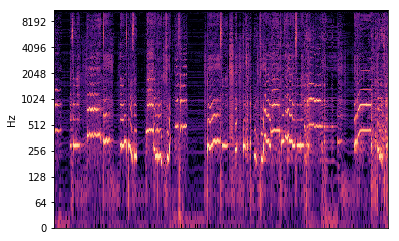

In [23]:
predicted_batch = run(encoder, decoder, start_sequences, 20)

predicted_audio_a = griffin_lim(predicted_batch[0].T, 
                                n_iter=100, 
                                window='hann', 
                                n_fft=fft_size, 
                                hop_length=hop_length)
plot_audio(predicted_audio_a) 

IPython.display.Audio(predicted_audio_a, rate=dataset.sample_rate)

/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


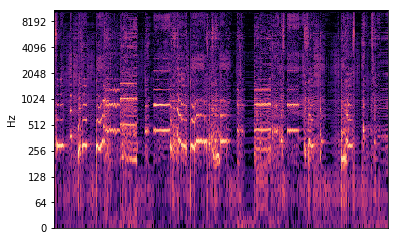

In [24]:
predicted_audio_b = griffin_lim(predicted_batch[1].T, 
                                n_iter=100, 
                                window='hann', 
                                n_fft=fft_size, 
                                hop_length=hop_length)
plot_audio(predicted_audio_b) 

IPython.display.Audio(predicted_audio_b, rate=dataset.sample_rate)

/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


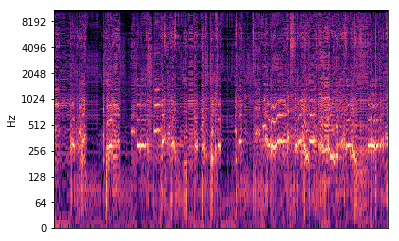

In [25]:
predicted_audio_c = griffin_lim(predicted_batch[2].T, 
                                n_iter=100, 
                                window='hann', 
                                n_fft=fft_size, 
                                hop_length=hop_length)
plot_audio(predicted_audio_c) 

IPython.display.Audio(predicted_audio_c, rate=dataset.sample_rate)

/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


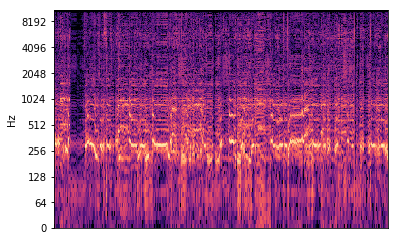

In [26]:
predicted_audio_d = griffin_lim(predicted_batch[3].T, 
                                n_iter=100, 
                                window='hann', 
                                n_fft=fft_size, 
                                hop_length=hop_length)
plot_audio(predicted_audio_d) 

IPython.display.Audio(predicted_audio_d, rate=dataset.sample_rate)